# Proof of Concept

## Problem
We're trying to understand the network of historical painters, analyzing how individuals were connected (by geographical and temporal proximity, by shared styles, by co-exhibition up to even the current day, and by explicitly noted teacher-student, friend, coworker, and influence relationships).

## Approach & Preliminary Results
We begin by visualizing, via century bins, the network that is produced via linking of painters by each of the strategies we are interested in (geographic and temporal proximity, shared styles, co-exhibition, and explictly noted relationships). These visualizations are the preliminary results we include within this notebook. To expand upon these results, we will conduct comparisons within a sort of matrix (century bins X type of linking). From the observations of this analysis, we hope to formulate a detailed, compelling question that will continue to drive our project forwards.

In [217]:
%pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [218]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np
import ast
from itertools import combinations
from collections import Counter
import re

In [219]:
url = "https://raw.githubusercontent.com/me9hanics/PainterPalette/main/datasets/artists.csv"
artists = pd.read_csv(url)

In [220]:
artists.head()

,artist,Nationality,citizenship,gender,styles,movement,Art500k_Movements,birth_place,death_place,birth_year,...,PaintingsExhibitedAt,PaintingsExhibitedAtCount,PaintingSchool,Influencedby,Influencedon,Pupils,Teachers,FriendsandCoworkers,Contemporary,Type
0,Bracha L. Ettinger,"French,Jewish,Israeli",Israel,female,New European Painting,New European Painting,{New European Painting:21},Tel Aviv,NaN,1948.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN
1,William H. Johnson,American,United States,male,"Cubism, Expressionism, Futurism, Naïve Art (Pr...",Harlem Renaissance (New Negro Movement),{Harlem Renaissance (New Negro Movement):102},Florence,Central Islip,1901.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN
2,Alexey Bogolyubov,Russian,NaN,NaN,"Realism, Romanticism",Romanticism,"{Romanticism,Realism:44}",NaN,NaN,NaN,...,"Saint Petersburg, Rybinsk, Russia, Moscow","{Rybinsk:2},{Russia:9},{Saint Petersburg:6},{M...",Peredvizhniki (Society for Traveling Art Exhib...,NaN,NaN,NaN,NaN,NaN,No,NaN
3,O. Louis Guglielmi,"American,Egyptian",United States,male,"Cubism, Expressionism, Magic Realism",Social Realism,"{Social Realism,Magic Realism:34}",Cairo,Amagansett,1906.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN
4,Mikalojus Konstantinas Ciurlionis,Lithuanian,Russian Empire,male,Symbolism,Symbolism,"{Art Nouveau:1},{Symbolism:169}",Varėna,Warsaw,1875.0,...,"Kaunas, Lithuania","{Kaunas:7},{Lithuania:7}",NaN,"allegories-and-symbols,boats-and-ships,",NaN,"The cycle of 5 paintings Deluge,",NaN,"Artists2/Mikalojus Ciurlionis/Wrath Ii 1904.jpg,",No,NaN


In [221]:
artists.shape

(10361, 30)

In [222]:
artists = artists.dropna(subset=['birth_year'])
print(artists.shape)

(9456, 30)


In [223]:
# split the artists into the century block that they belong
artists_14c = artists[(artists['birth_year'] >= 1300) & (artists['birth_year'] < 1400)]
artists_15c = artists[(artists['birth_year'] >= 1400) & (artists['birth_year'] < 1500)]
artists_16c = artists[(artists['birth_year'] >= 1500) & (artists['birth_year'] < 1600)]
artists_17c = artists[(artists['birth_year'] >= 1600) & (artists['birth_year'] < 1700)]
artists_18c = artists[(artists['birth_year'] >= 1700) & (artists['birth_year'] < 1800)]
artists_19c = artists[(artists['birth_year'] >= 1800) & (artists['birth_year'] < 1900)]
artists_20c = artists[(artists['birth_year'] >= 1900) & (artists['birth_year'] < 2100)] # also includes 21st-century artists since they are so sparse

In [224]:
print(artists_14c.shape)
print(artists_15c.shape)
print(artists_16c.shape)
print(artists_17c.shape)
print(artists_18c.shape)
print(artists_19c.shape)
print(artists_20c.shape)

(65, 30)
(289, 30)
(526, 30)
(759, 30)
(1124, 30)
(3170, 30)
(3418, 30)


In [225]:
# to do: save a spring layout for each century; figure out how to display nicely with labels

In [226]:
# for each century block, create a visualization based on geographic proximity
# potential future: color edges based on location (try later w/ weighting to prioritize which shared location is used for coloring); consider years of the geographical proximity; weight the edges based on # of common years
def unweighted_geo_proximity(artists):
  G = nx.Graph()
  artists = artists[["artist", "locations"]]
  artists = artists.dropna()
  G.add_nodes_from(artists["artist"])

  locs_to_artists = dict()
  for index, row in artists.iterrows():
    for location in row["locations"].split(","):
      if location in locs_to_artists:
        locs_to_artists[location].append(row["artist"])
      else:
        locs_to_artists[location] = [row["artist"]]

  for location in locs_to_artists:
    for artist1 in locs_to_artists[location]:
      for artist2 in locs_to_artists[location]:
        if artist1 != artist2 and not G.has_edge(artist1, artist2):
          G.add_edge(artist1, artist2, location=location)

  # Create colormap for locations
  locations = locs_to_artists.keys()
  cmap = plt.get_cmap('tab10')

  # Map each location to a color
  color_map = {loc: cmap(i % cmap.N) for i, loc in enumerate(locations)}

  # Convert locations to colors
  colors = [color_map[loc] for loc in locations]

  # Add color attribute to edges
  for u, v in G.edges():
    G[u][v]['color'] = color_map.get(G[u][v].get('location'), 'gray')

  return G

In [227]:
# format is a list of dictionaries {city, date_ranges: [{start_year, end_year}, {start_year, end_year}], ...}
def parse_locations(location_str):
    locations = ast.literal_eval(location_str)
    result = []
    for item in locations:
        location, years_part = item.split(':')
        ranges = years_part.split(',')
        date_ranges = []
        for r in ranges:
            start_year, end_year = r.split('-')
            date_ranges.append({
                'start_year': int(start_year),
                'end_year': int(end_year)
            })
        result.append({
            'location': location,
            'date_ranges': date_ranges
        })
    return result

In [228]:
# for each century block, create a visualization based on geographic proximity
# color edges based on location and weighting to prioritize which shared location is used for coloring); consider years of the geographical proximity; weight the edges based on # of common years
def geo_proximity(artists):
  G = nx.Graph()
  
  # drop NA values
  artists = artists[artists['locations_with_years'].notna() & (artists['locations_with_years'] != '[]')]
  artists = artists[["artist", "locations_with_years"]]
  artists = artists.dropna()

  artists['locations_parsed'] = artists['locations_with_years'].apply(parse_locations)

  G.add_nodes_from(artists["artist"])

  # flatten table
  rows = []
  for _, artist_row in artists.iterrows():
      for loc in artist_row['locations_parsed']:
          for date_range in loc['date_ranges']:
              rows.append({
                  'artist': artist_row['artist'],
                  'location': loc['location'],
                  'start_year': date_range['start_year'],
                  'end_year': date_range['end_year']
              })

  df_flat = pd.DataFrame(rows)

  edges = {}
  for location, group in df_flat.groupby('location'):
      artist_rows = list(group.itertuples())
      for a1, a2 in combinations(artist_rows, 2):
          # check if time ranges overlap
          overlap_start = max(a1.start_year, a2.start_year)
          overlap_end = min(a1.end_year, a2.end_year)
          artist1, artist2 = a1.artist, a2.artist
          if overlap_start <= overlap_end and artist1 != artist2:
              # add edges between 2 artists in alphabetical order of the artists
              if artist1 < artist2:
                if (artist1, artist2) in edges:
                  # edges keep weight and locations attributes, where locations keeps a dictionary of locations to weights/num overlapping years
                  edges[(artist1, artist2)]['weight'] += weight
                  edge_locations = edges[(artist1, artist2)]['locations']
                  if location in edge_locations:
                    edge_locations[location] += weight
                  else:
                    edge_locations[location] = weight
                else:
                  weight = overlap_end - overlap_start + 1
                  edges[(artist1, artist2)] = {'weight': weight, 'locations': {location: weight}}
              else: # a2 < a1
                if (artist2, artist1) in edges:
                  edges[(artist2, artist1)]['weight'] += weight
                  edge_locations = edges[(artist2, artist1)]['locations']
                  if location in edge_locations:
                    edge_locations[location] += weight
                  else:
                    edge_locations[location] = weight
                else:
                  weight = overlap_end - overlap_start + 1
                  edges[(artist2, artist1)] = {'weight': weight, 'locations': {location: weight}}
  
  loc_counts = {}

  for edge in edges:
    edge_locations = edges[edge]['locations']
    longest_location = max(edge_locations, key=edge_locations.get)
    edges[edge]['location'] = longest_location
    if longest_location in loc_counts:
      loc_counts[longest_location] += 1
    else:
      loc_counts[longest_location] = 1
  
  # add edges
  G.add_edges_from((u, v, attrs) for (u, v), attrs in edges.items())

  # Create colormap for locations
  locations = loc_counts.keys()
  cmap = plt.get_cmap('rainbow')

  # Map each location to a color
  color_map = {loc: cmap(i / len(locations)) for i, loc in enumerate(locations)}

  # Add color attribute to edges
  for u, v in G.edges():
    G[u][v]['color'] = color_map.get(G[u][v].get('location'), 'gray')

  return G

In [229]:
def visualize_geo_proximity(G, tag, labels=False):
  plt.figure(figsize=(10, 10)) # Increase figure size for better visibility
  pos = nx.spring_layout(G, k=0.5, iterations=50) # Use spring layout with increased 'k' for spacing
  edge_colors = [G[u][v]['color'] for u, v in G.edges()]
  top_10_colors = {color for color, _ in Counter(edge_colors).most_common(10)}
  color_map = {G[u][v]['location']: G[u][v]['color'] for u, v in G.edges()}
  legend_handles = [mpatches.Patch(color=color, label=loc) for loc, color in color_map.items() if color in top_10_colors]
  nx.draw_networkx(G, pos, edge_color=edge_colors, with_labels=labels, node_size=40, font_size=8)

  # make text more transparent
  ax = plt.gca()
  for text in ax.texts:
      text.set_alpha(0.6)
  plt.legend(handles=legend_handles)
  plt.title('Geographic Proximity Network (' + tag + ' Artists)')
  plt.axis('off')
  plt.show()

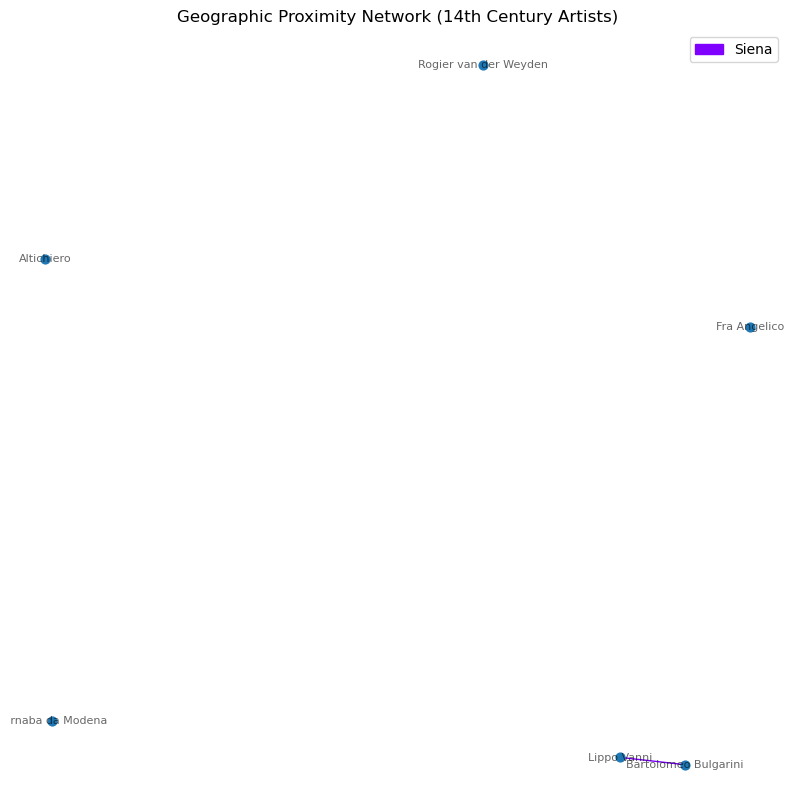

In [230]:
visualize_geo_proximity(geo_proximity(artists_14c), "14th Century", True)

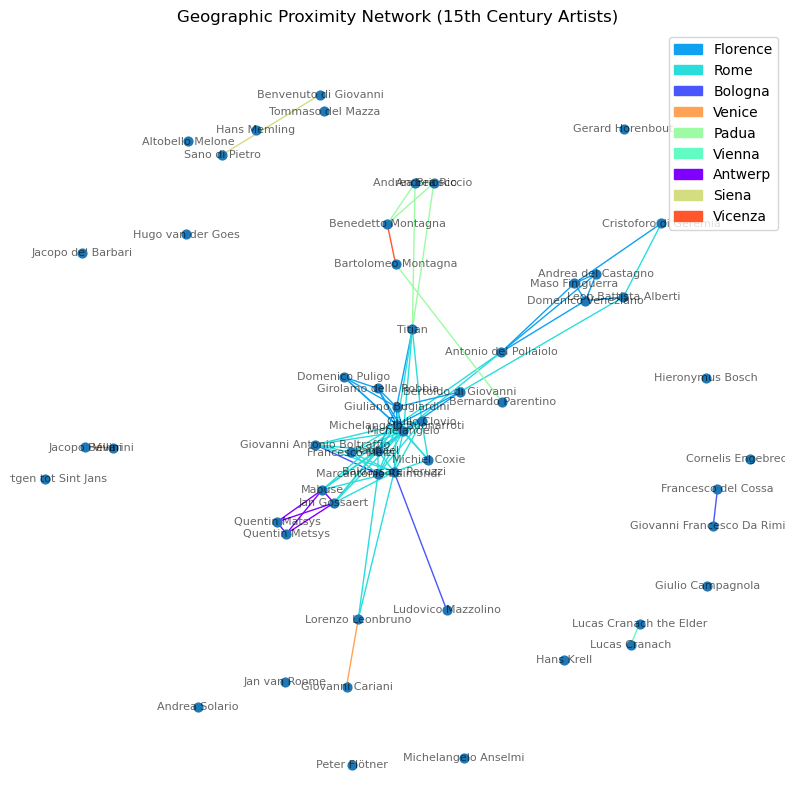

In [231]:
visualize_geo_proximity(geo_proximity(artists_15c), "15th Century", True)

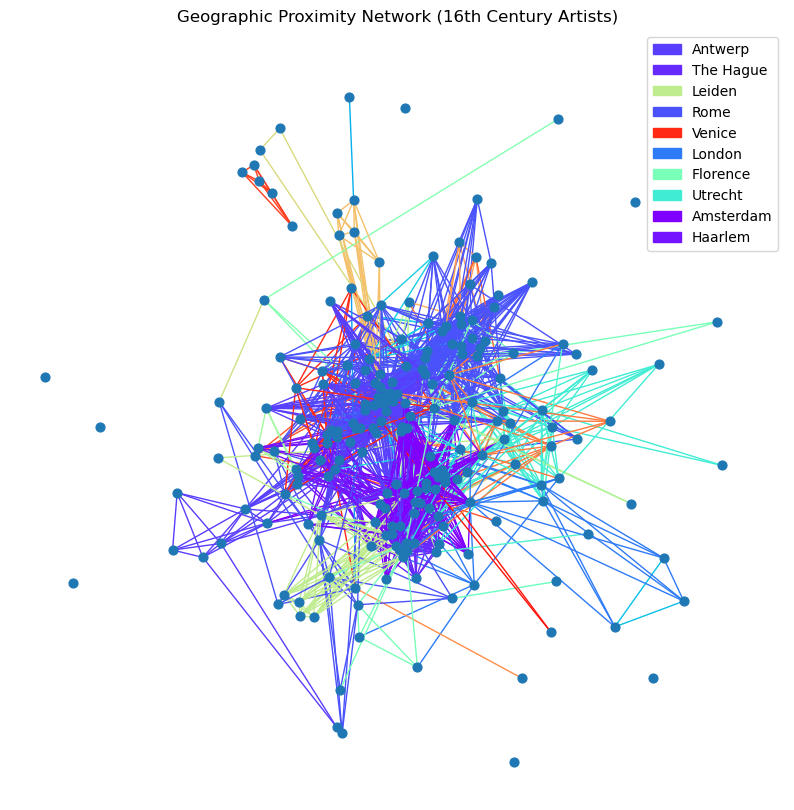

In [232]:
visualize_geo_proximity(geo_proximity(artists_16c), "16th Century")

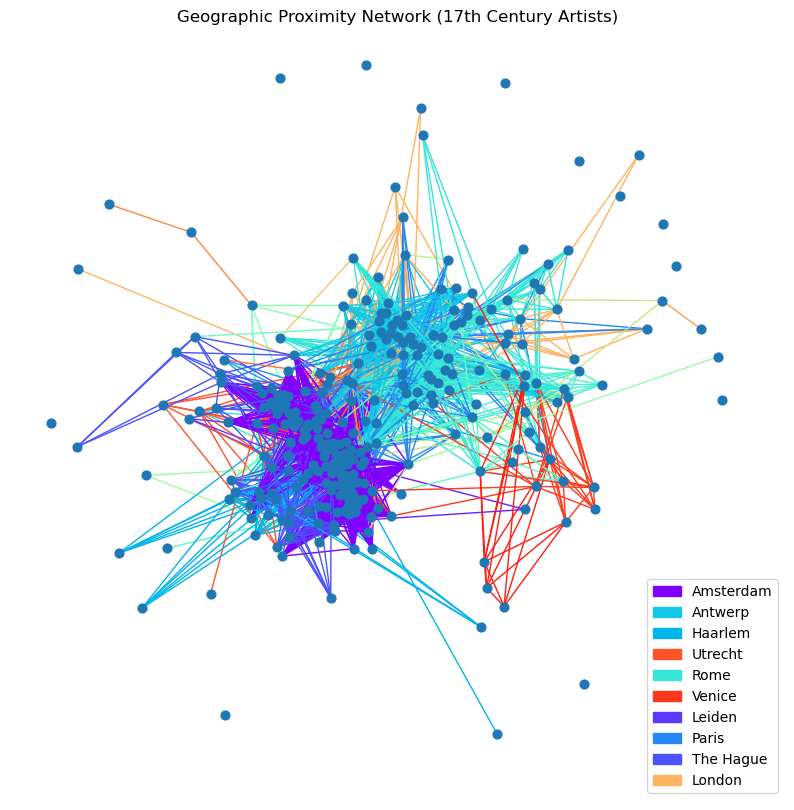

In [233]:
visualize_geo_proximity(geo_proximity(artists_17c), "17th Century")

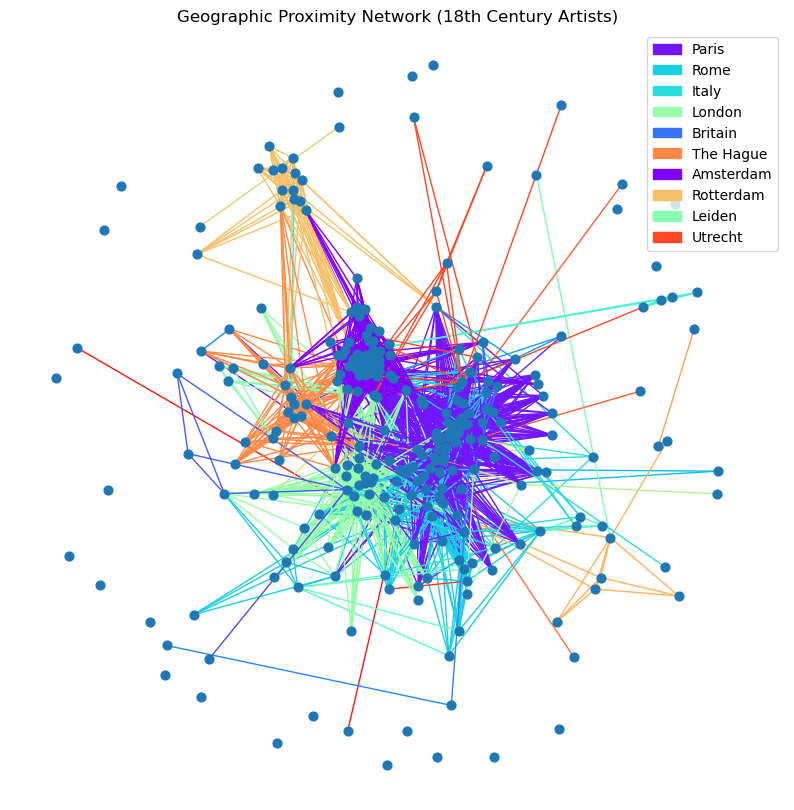

In [234]:
visualize_geo_proximity(geo_proximity(artists_18c), "18th Century")

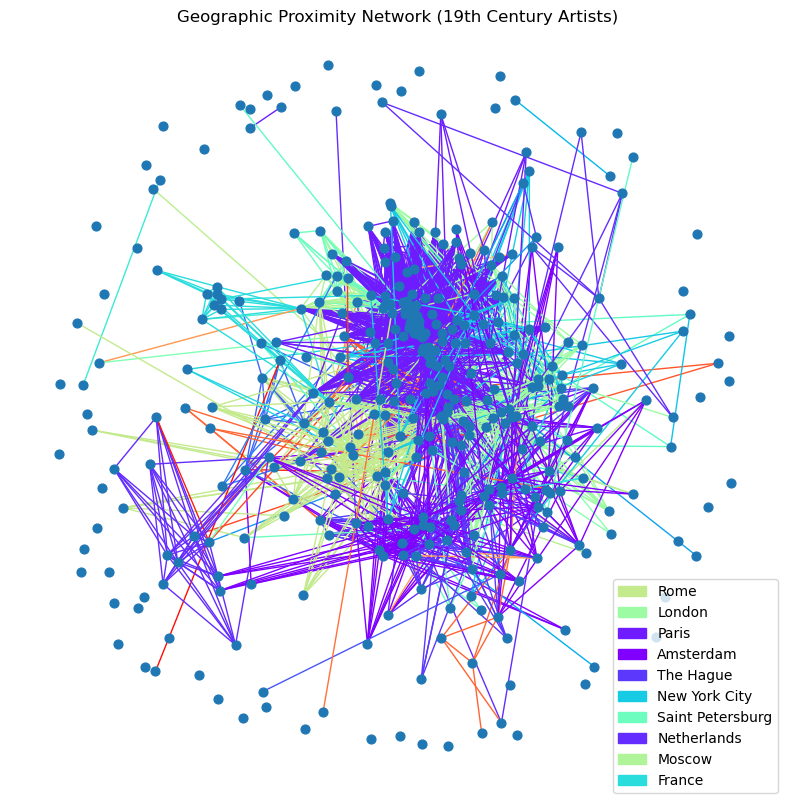

In [235]:
visualize_geo_proximity(geo_proximity(artists_19c), "19th Century")

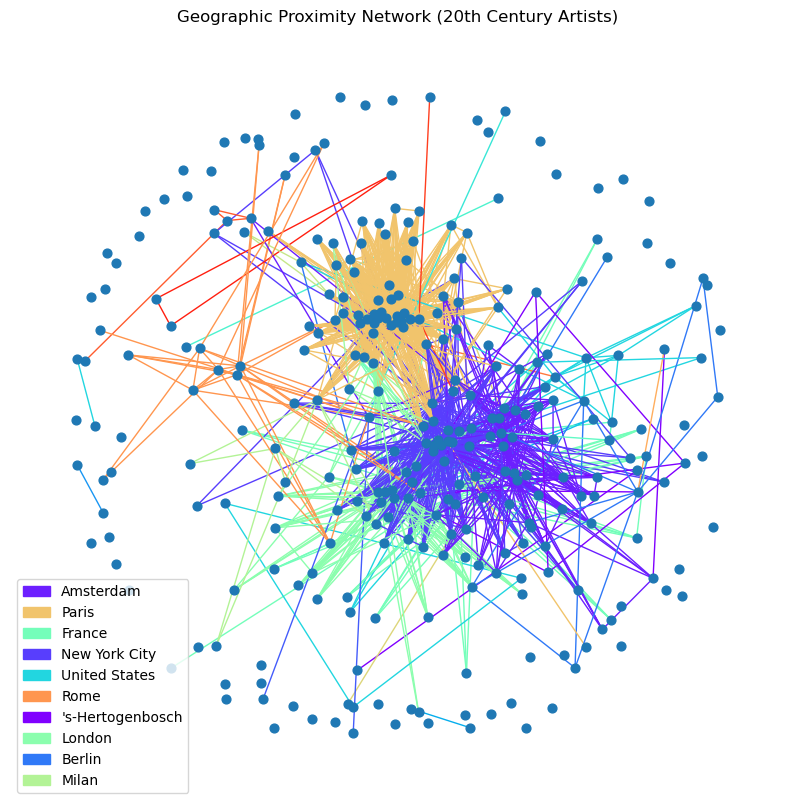

In [236]:
visualize_geo_proximity(geo_proximity(artists_20c), "20th Century")

In [237]:
# for each century block, create a visualization based on shared style
print("Style Count: ", artists['styles'].count())
print(artists['styles'].value_counts())
print("Styles Extended Count: ", artists['styles_extended'].count())
print(artists['styles_extended'].value_counts())
print("Styles_Count Count: ", artists['StylesCount'].count())
print(artists['StylesCount'].value_counts())

Style Count:  2980
styles
Romanticism                                                                97
Baroque                                                                    80
Surrealism                                                                 59
Impressionism                                                              57
Realism                                                                    50
                                                                           ..
Art Nouveau (Modern), Orientalism                                           1
Art Nouveau (Modern), Byzantine, Japonism, Realism, Symbolism               1
Art Nouveau (Modern), Expressionism, Naïve Art (Primitivism), Symbolism     1
Art Nouveau (Modern), Regionalism, Romanticism, Symbolism, Unknown          1
 Neo-Dada,Dada, Renaissance, Surrealism                                     1
Name: count, Length: 1318, dtype: int64
Styles Extended Count:  2980
styles_extended
{Conceptual Art:10}            

In [238]:
# adding an edge if they share any style
# potential future: color edges based on shared style (try later w/ weighting to prioritize which shared style is used for coloring); weight the edges based on # of shared styles
def unweighted_style_share(artists):
  G = nx.Graph()
  artists = artists[["artist", "styles"]]
  artists = artists.dropna()
  G.add_nodes_from(artists["artist"])

  styles_to_artists = dict()
  for index, row in artists.iterrows():
    for style in row["styles"].split(","):
      if style != 'Unknown':
        if style in styles_to_artists:
          styles_to_artists[style].append(row["artist"])
        else:
          styles_to_artists[style] = [row["artist"]]

  for style in styles_to_artists:
    for artist1 in styles_to_artists[style]:
      for artist2 in styles_to_artists[style]:
        if artist1 != artist2 and not G.has_edge(artist1, artist2):
          G.add_edge(artist1, artist2)

  return G

In [239]:
def parse_styles(s):
  return {k: int(v) for k, v in re.findall(r'\{([^:]+):(\d+)\}', s)}

In [240]:
# color edges based on shared style (try later w/ weighting to prioritize which shared style is used for coloring); weight the edges based on # of shared styles
# using styles_extended to count
def style_share(artists):
  G = nx.Graph()
  artists = artists[["artist", "styles_extended"]]
  artists = artists.dropna()

  G.add_nodes_from(artists["artist"])

  artists['styles'] = artists['styles_extended'].apply(parse_styles)

  styles_to_artists = dict()
  for index, row in artists.iterrows():
    for style in row["styles"].keys():
      if style != 'Unknown':
        if style in styles_to_artists:
          styles_to_artists[style][row['artist']] = row['styles'][style]
        else:
          styles_to_artists[style] = {row["artist"]: row['styles'][style]}

  for style in styles_to_artists:
    artists = styles_to_artists[style].keys()
    for artist1 in artists:
      for artist2 in artists:
        style_overlap = min(styles_to_artists[style][artist1], styles_to_artists[style][artist2])
        if artist1 != artist2 and not G.has_edge(artist1, artist2):
          G.add_edge(artist1, artist2, weight=style_overlap, styles={style: style_overlap})
        elif G.has_edge(artist1, artist2): # increment weight and add style to dictionary
          G[artist1][artist2]['weight'] += style_overlap
          G[artist1][artist2]['styles'][style] = style_overlap
  
  style_counts = nx.get_edge_attributes(G, "styles")

  # set dominant style
  for edge in style_counts:
    edge_styles = style_counts[edge]
    largest_style = max(edge_styles, key=edge_styles.get)
    G[edge[0]][edge[1]]['style'] = largest_style

  # Create colormap for styles
  styles = set(nx.get_edge_attributes(G, 'style').values())
  cmap = plt.get_cmap('rainbow')

  # Map each style to a color
  color_map = {style: cmap(i / len(styles)) for i, style in enumerate(styles)}

  # Add color attribute to edges
  for u, v in G.edges():
    G[u][v]['color'] = color_map.get(G[u][v].get('style'), 'gray')

  return G

In [241]:
def visualize_style_sharing(G, tag, labels=False):
  plt.figure(figsize=(10, 10)) # Increase figure size for better visibility
  pos = nx.spring_layout(G, k=0.5, iterations=50) # Use spring layout with increased 'k' for spacing
  edge_colors = [G[u][v]['color'] for u, v in G.edges()]
  edge_styles = [G[u][v]['style'] for u, v in G.edges()]
  top_10_styles = {style for style, _ in Counter(edge_styles).most_common(10)}
  color_map = {G[u][v]['style']: G[u][v]['color'] for u, v in G.edges()}
  legend_handles = [mpatches.Patch(color=color, label=style) for style, color in color_map.items() if style in top_10_styles]
  nx.draw_networkx(G, pos, edge_color=edge_colors, with_labels=labels, node_size=40, font_size=8)

  # make text more transparent
  ax = plt.gca()
  for text in ax.texts:
      text.set_alpha(0.6)
  plt.legend(handles=legend_handles)
  plt.title('Shared Styles Network (' + tag + ' Artists)')
  plt.axis('off')
  plt.show()

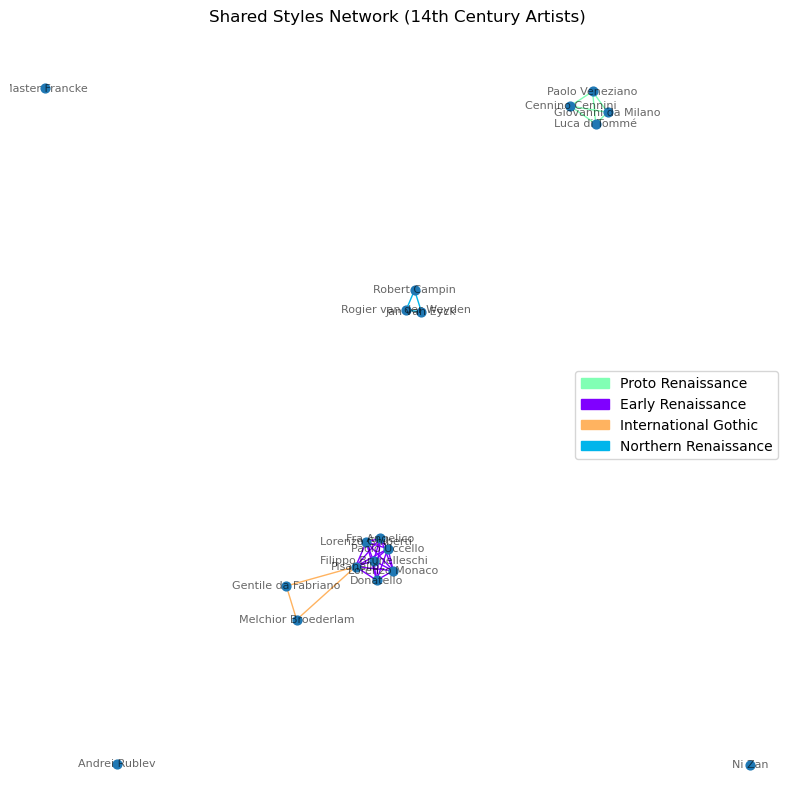

In [242]:
visualize_style_sharing(style_share(artists_14c), "14th Century", True)

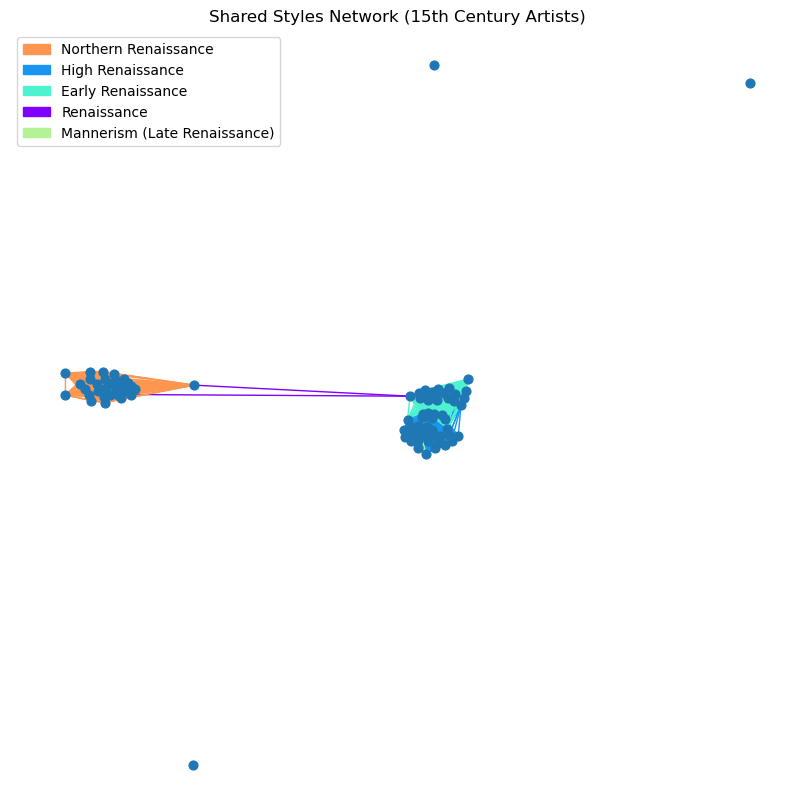

In [243]:
visualize_style_sharing(style_share(artists_15c), "15th Century")

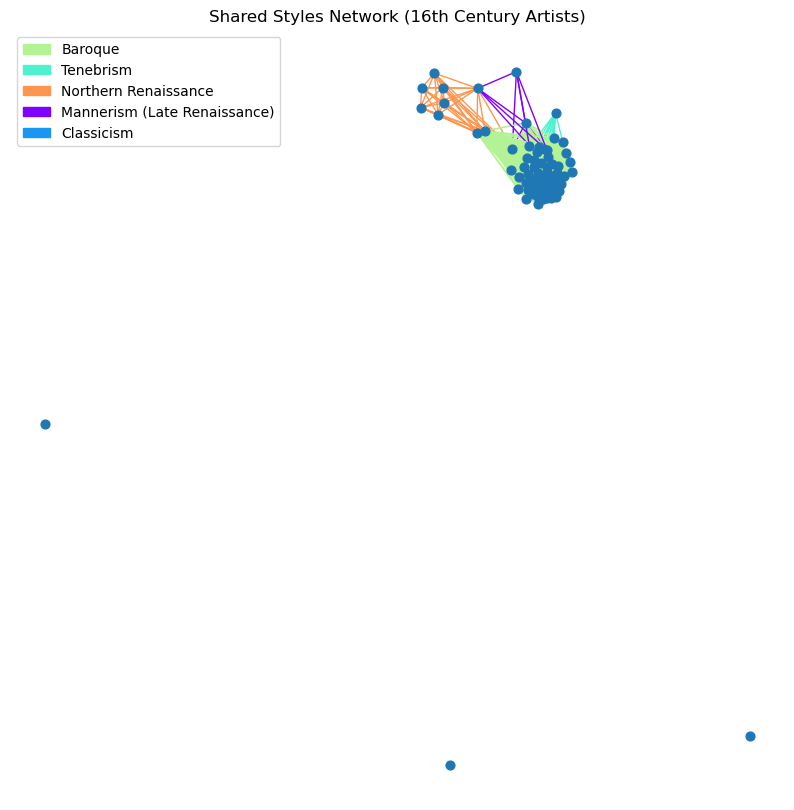

In [244]:
visualize_style_sharing(style_share(artists_16c), "16th Century")

In [245]:
artists[artists['artist'] == 'Chen Hongshou'].head()

,artist,Nationality,citizenship,gender,styles,movement,Art500k_Movements,birth_place,death_place,birth_year,...,PaintingsExhibitedAt,PaintingsExhibitedAtCount,PaintingSchool,Influencedby,Influencedon,Pupils,Teachers,FriendsandCoworkers,Contemporary,Type
1801,Chen Hongshou,Chinese,Qing dynasty,male,"Ink and wash painting, Unknown",Ming Dynasty (1368–1644),{Ming Dynasty (1368–1644):15},Zhuji,Zhejiang,1598.0,...,China,{China:1},NaN,NaN,NaN,NaN,NaN,NaN,No,NaN


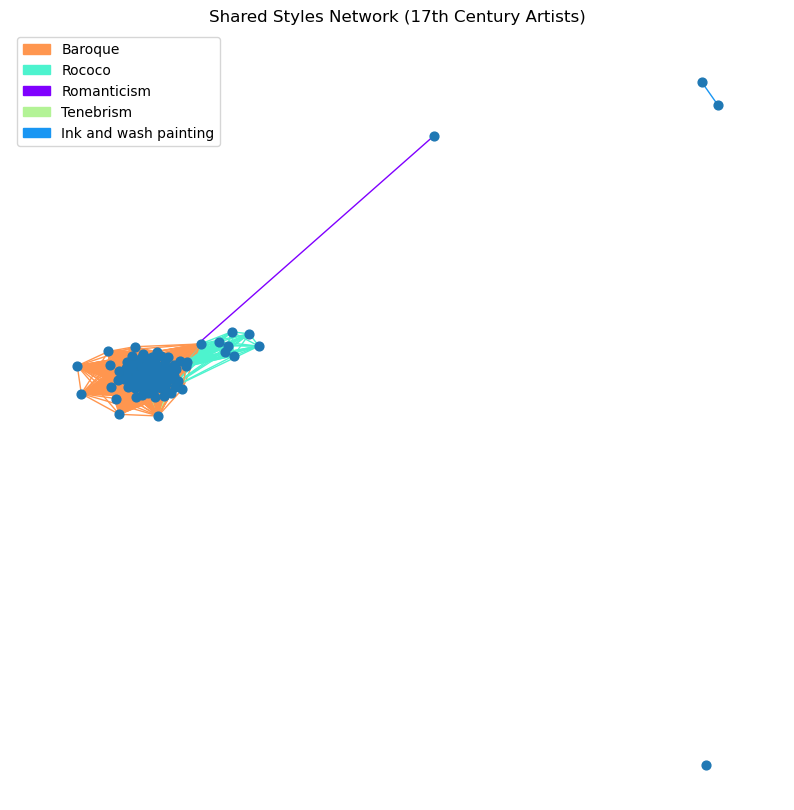

In [246]:
visualize_style_sharing(style_share(artists_17c), "17th Century")

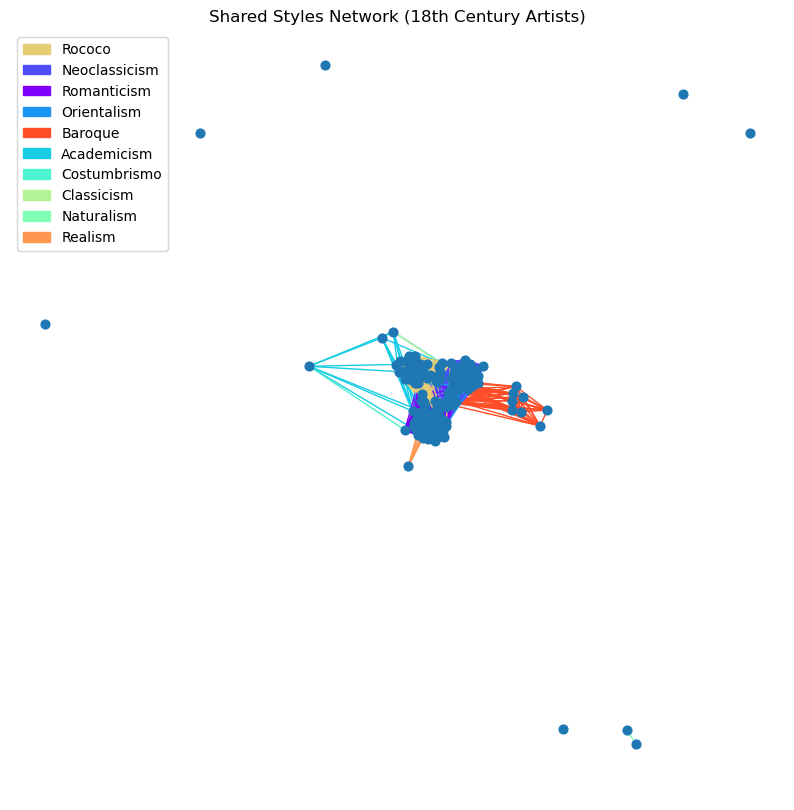

In [247]:
visualize_style_sharing(style_share(artists_18c), "18th Century")

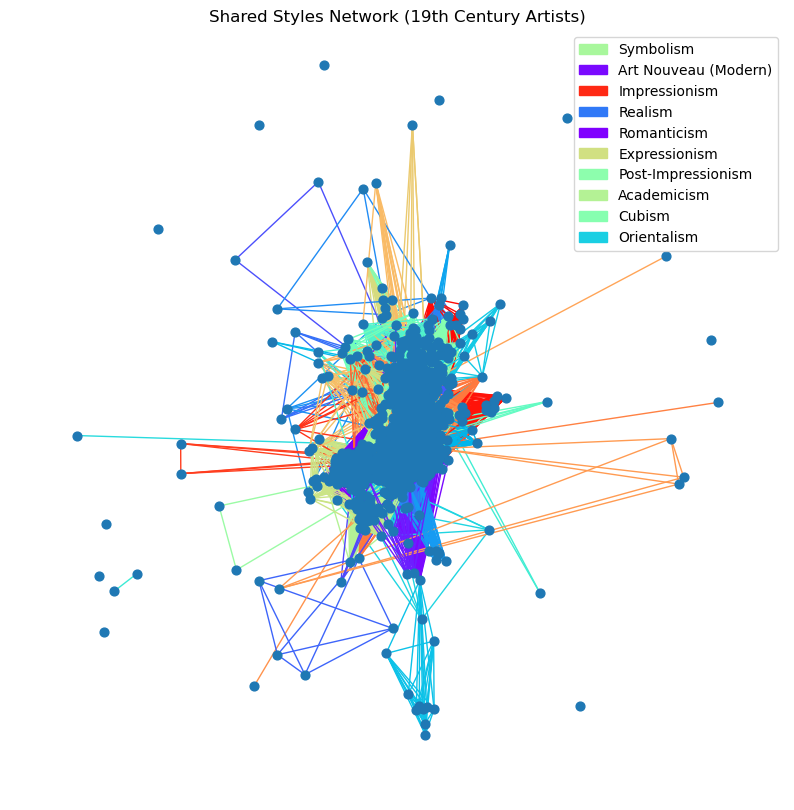

In [248]:
visualize_style_sharing(style_share(artists_19c), "19th Century")

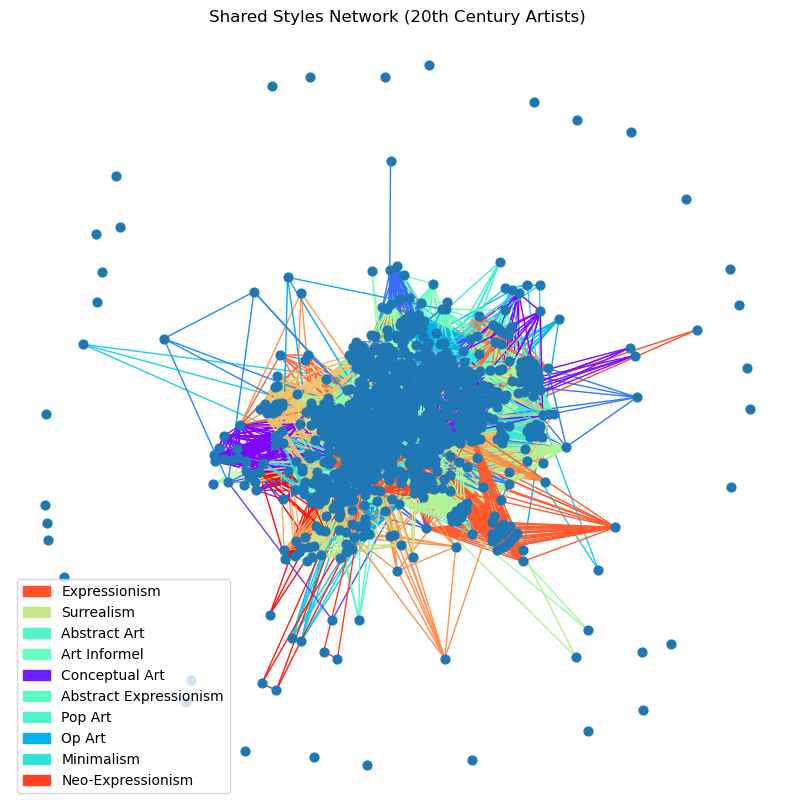

In [249]:
visualize_style_sharing(style_share(artists_20c), "20th Century")

In [250]:
# for each century block, create a visualization based on co-exhibition
print("Exhibition Count: ", artists['PaintingsExhibitedAt'].count())
print(artists['PaintingsExhibitedAt'].value_counts())

Exhibition Count:  3697
PaintingsExhibitedAt
Amsterdam                                                                                                                                                                                                                                                                                                                   158
Italy                                                                                                                                                                                                                                                                                                                       138
France                                                                                                                                                                                                                                                                                                                     

In [251]:
# future potential: weight the edges based on # of shared exhibitions
def shared_exhibitions(artists):
  G = nx.Graph()
  artists = artists[["artist", "PaintingsExhibitedAt"]]
  artists = artists.dropna()
  G.add_nodes_from(artists["artist"])

  exhibitions_to_artists = dict()
  for index, row in artists.iterrows():
    for exhibition in row["PaintingsExhibitedAt"].split(","):
      if exhibition in exhibitions_to_artists:
        exhibitions_to_artists[exhibition].append(row["artist"])
      else:
        exhibitions_to_artists[exhibition] = [row["artist"]]

  for exhibition in exhibitions_to_artists:
    for artist1 in exhibitions_to_artists[exhibition]:
      for artist2 in exhibitions_to_artists[exhibition]:
        if artist1 != artist2 and not G.has_edge(artist1, artist2):
          G.add_edge(artist1, artist2)

  return G

In [252]:
def visualize_exhibition_sharing(G, tag):
  plt.figure(figsize=(10, 10)) # Increase figure size for better visibility
  pos = nx.spring_layout(G, k=0.5, iterations=50) # Use spring layout with increased 'k' for spacing
  nx.draw_networkx(G, pos, with_labels=False, node_size=40, width=0.5, alpha=0.7)
  plt.title('Shared Exhibitions Network (' + tag + ' Artists)')
  plt.axis('off')
  plt.show()

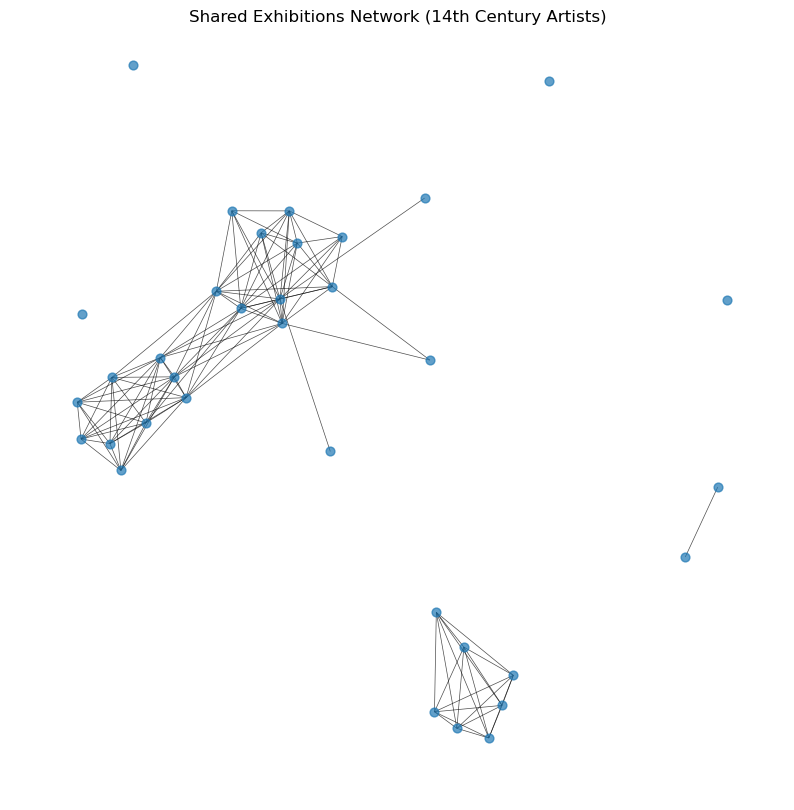

In [253]:
visualize_exhibition_sharing(shared_exhibitions(artists_14c), "14th Century")

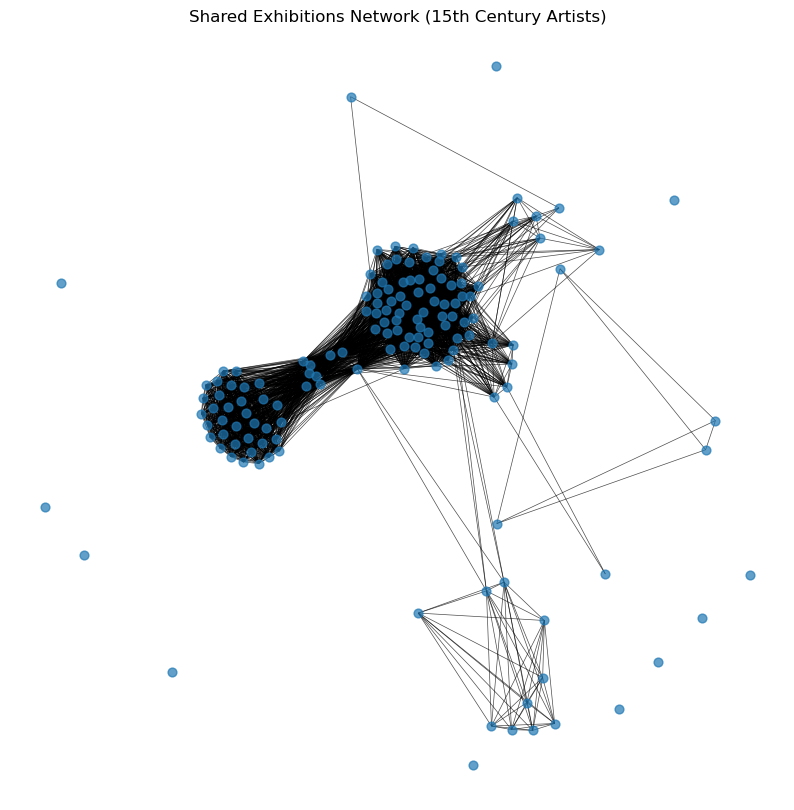

In [254]:
visualize_exhibition_sharing(shared_exhibitions(artists_15c), "15th Century")

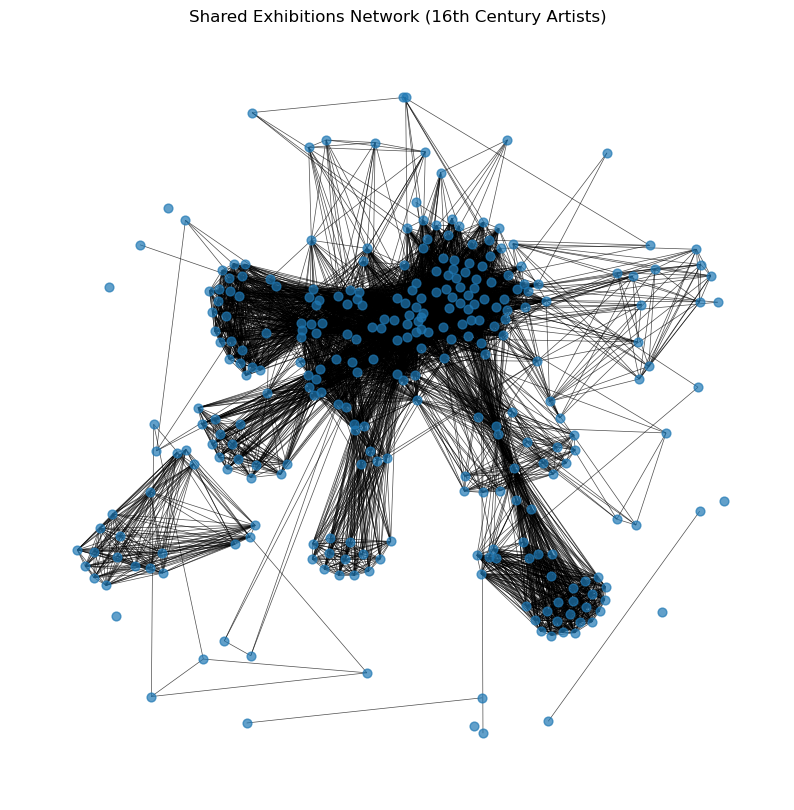

In [255]:
visualize_exhibition_sharing(shared_exhibitions(artists_16c), "16th Century")

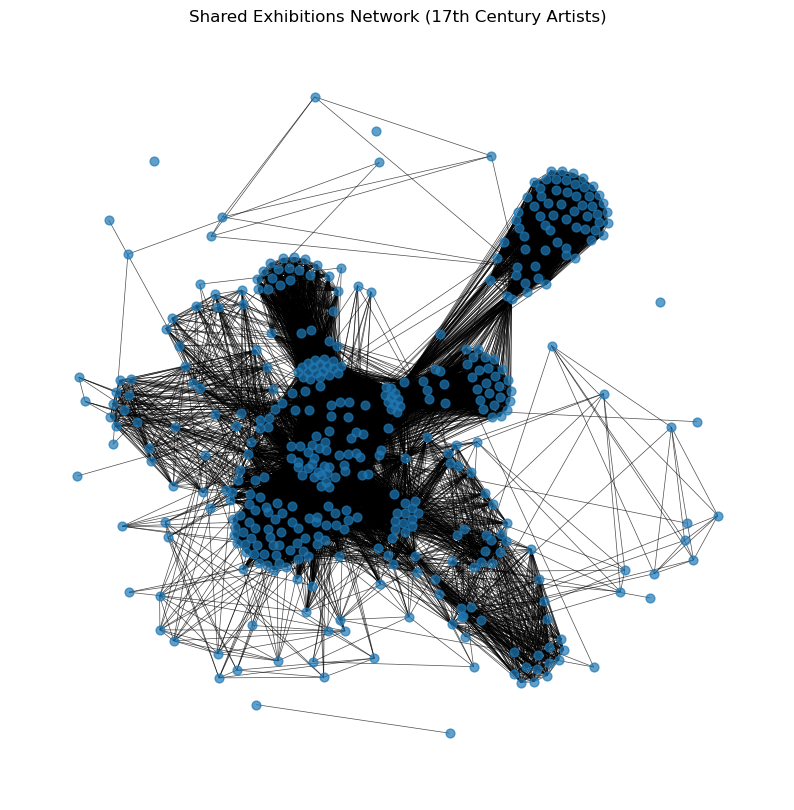

In [256]:
visualize_exhibition_sharing(shared_exhibitions(artists_17c), "17th Century")

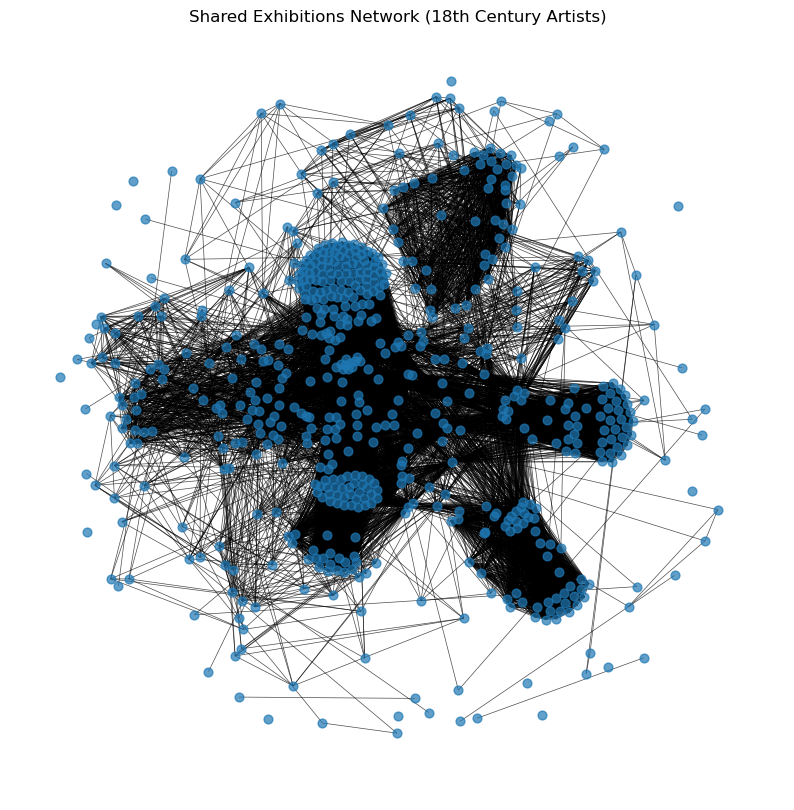

In [257]:
visualize_exhibition_sharing(shared_exhibitions(artists_18c), "18th Century")

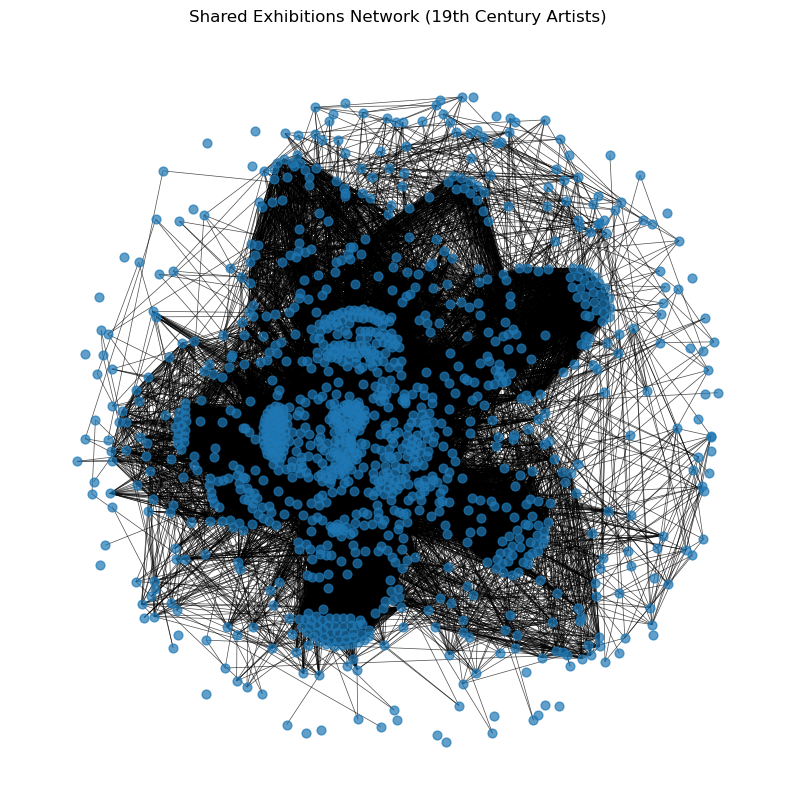

In [258]:
visualize_exhibition_sharing(shared_exhibitions(artists_19c), "19th Century")

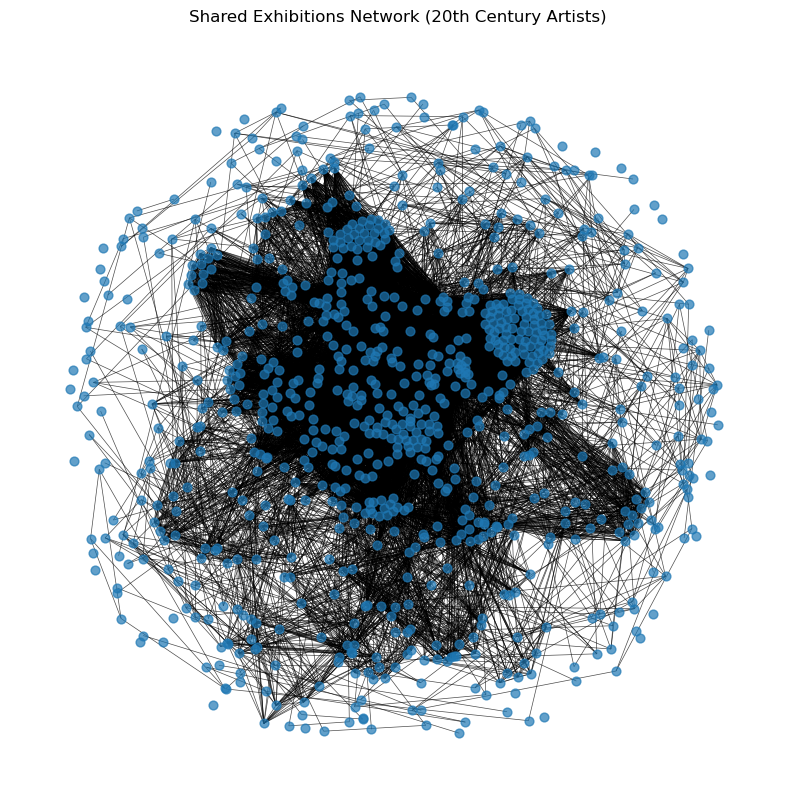

In [259]:
visualize_exhibition_sharing(shared_exhibitions(artists_20c), "20th Century")

In [260]:
# for each century block, create a visualization based on influence/teacher/friend relationships (might be too sparse)
def artist_relationships(artists):
  G = nx.DiGraph()
  artists = artists[["artist", "birth_year", "Influencedby", "Influencedon", "Pupils", "Teachers", "FriendsandCoworkers"]]
  artists = artists.dropna(how='all')
  # print("Number of artists with relationship data: ", artists.shape[0])
  G.add_nodes_from(artists["artist"].dropna().unique())

  for _, row in artists.iterrows():
    if row["Influencedby"] is not None:
      influences = str(row["Influencedby"]).split(",")
      for influence in influences:
        if influence in G:
          G.add_edge(influence, row["artist"], edge_type="influenced")

  for _, row in artists.iterrows():
    if row["Influencedon"] is not None:
      influencees = str(row["Influencedon"]).split(",")
      for influencee in influencees:
        if influencee in G and not G.has_edge(row["artist"], influencee):
          G.add_edge(row["artist"], influencee, edge_type="influenced")

  for _, row in artists.iterrows():
    if row["Pupils"] is not None:
      pupils = str(row["Pupils"]).split(",")
      for pupil in pupils:
        if pupil in G:
          G.add_edge(row["artist"], pupil, edge_type="taught")

  for _, row in artists.iterrows():
    if row["Teachers"] is not None:
      teachers = str(row["Teachers"]).split(",")
      for teacher in teachers:
        if teacher in G and not G.has_edge(teacher, row["artist"]):
          G.add_edge(teacher, row["artist"], edge_type="taught")

  for _, row in artists.iterrows():
    if row["FriendsandCoworkers"] is not None:
      friends = str(row["FriendsandCoworkers"]).split(",")
      for friend in friends:
        if friend in G:
          # to make a DAG, add edge from older to younger artist
          if row["birth_year"] is not None and artists[artists["artist"] == friend]["birth_year"].values[0] is not None:
            older_artist = row["artist"] if row["birth_year"] < artists[artists["artist"] == friend]["birth_year"].values[0] else friend
            younger_artist = friend if older_artist == row["artist"] else row["artist"]
          else: # handle missing birth year case
            older_artist = row["artist"]
            younger_artist = friend
          if not G.has_edge(older_artist, younger_artist):
            G.add_edge(older_artist, younger_artist, edge_type="friend")
  
  # drop nodes that don't have any edges
  for node in list(G.nodes()):
    if G.degree(node) == 0:
      G.remove_node(node)

  # drop arbitrary edges to break cycles
  try:
    while True:
        cycle = nx.find_cycle(G, orientation='original')
        # remove one edge from the cycle
        G.remove_edge(*cycle[0][:2])
  except nx.NetworkXNoCycle:
      pass

  # print("Number of nodes: ", G.number_of_nodes())
  # print("Number of edges: ", G.number_of_edges())
  return G

In [261]:
def visualize_artist_relationships(G, tag):

  # define color mapping
  color_map = {
      "influenced": "orange",
      "taught": "blue",
      "friend": "purple"
  }

  # extract edge colors
  edge_colors = [
      color_map[G[u][v]["edge_type"]]
      for u, v in G.edges()
  ]

  plt.figure(figsize=(10, 10)) # Increase figure size for better visibility
  pos = nx.spring_layout(G, k=0.5, iterations=50) # Use spring layout with increased 'k' for spacing
  nx.draw(G, pos, with_labels=True, node_size=40, label=True, edge_color=edge_colors)
  # add legend for edge colors
  legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=8, label=type_) for type_, color in color_map.items()]
  plt.legend(handles=legend_elements, loc='upper right')
  plt.title('Relationship Network (' + tag + ' Artists)')
  plt.axis('off')
  plt.show()

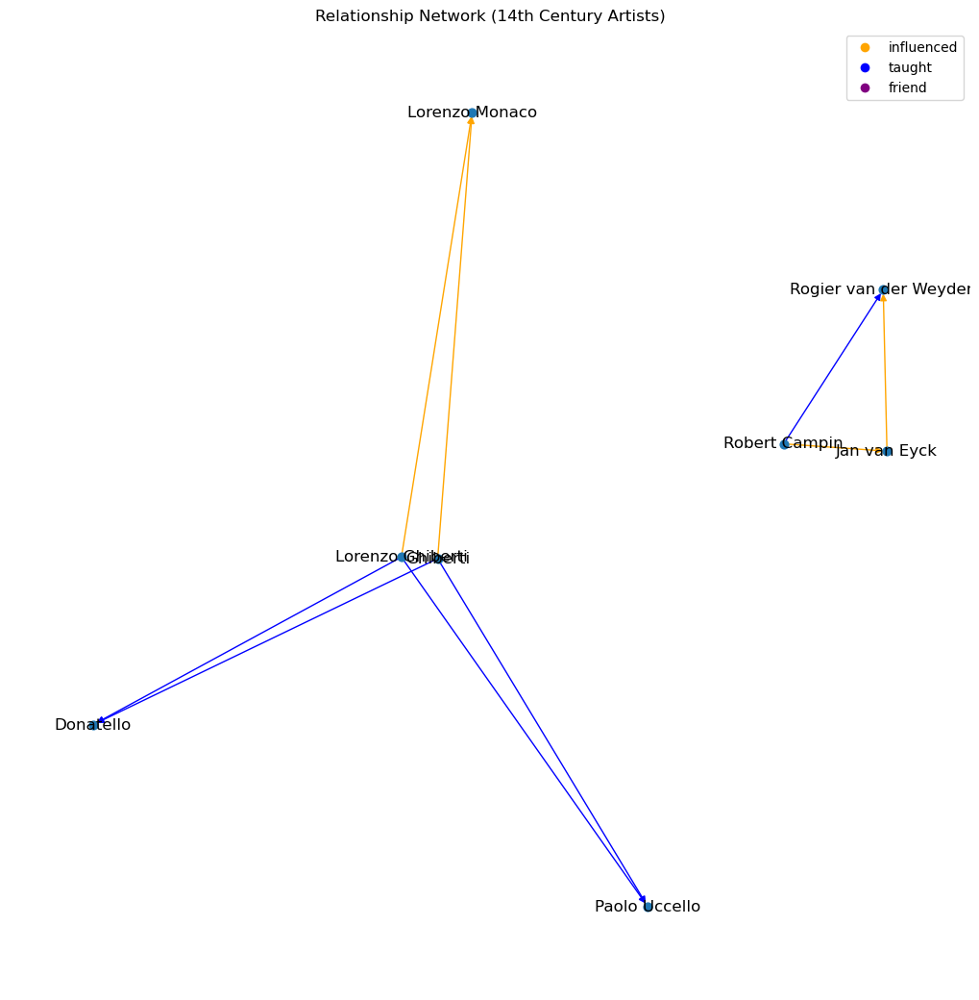

Edges:  [('Lorenzo Ghiberti', 'Lorenzo Monaco', {'edge_type': 'influenced'}), ('Lorenzo Ghiberti', 'Donatello', {'edge_type': 'taught'}), ('Lorenzo Ghiberti', 'Paolo Uccello', {'edge_type': 'taught'}), ('Jan van Eyck', 'Rogier van der Weyden', {'edge_type': 'influenced'}), ('Robert Campin', 'Jan van Eyck', {'edge_type': 'influenced'}), ('Robert Campin', 'Rogier van der Weyden', {'edge_type': 'taught'}), ('Ghiberti', 'Lorenzo Monaco', {'edge_type': 'influenced'}), ('Ghiberti', 'Donatello', {'edge_type': 'taught'}), ('Ghiberti', 'Paolo Uccello', {'edge_type': 'taught'})]


In [262]:
artist_relationships_14c = artist_relationships(artists_14c)
visualize_artist_relationships(artist_relationships_14c, "14th Century")
# print edges
print("Edges: ", artist_relationships_14c.edges(data=True))

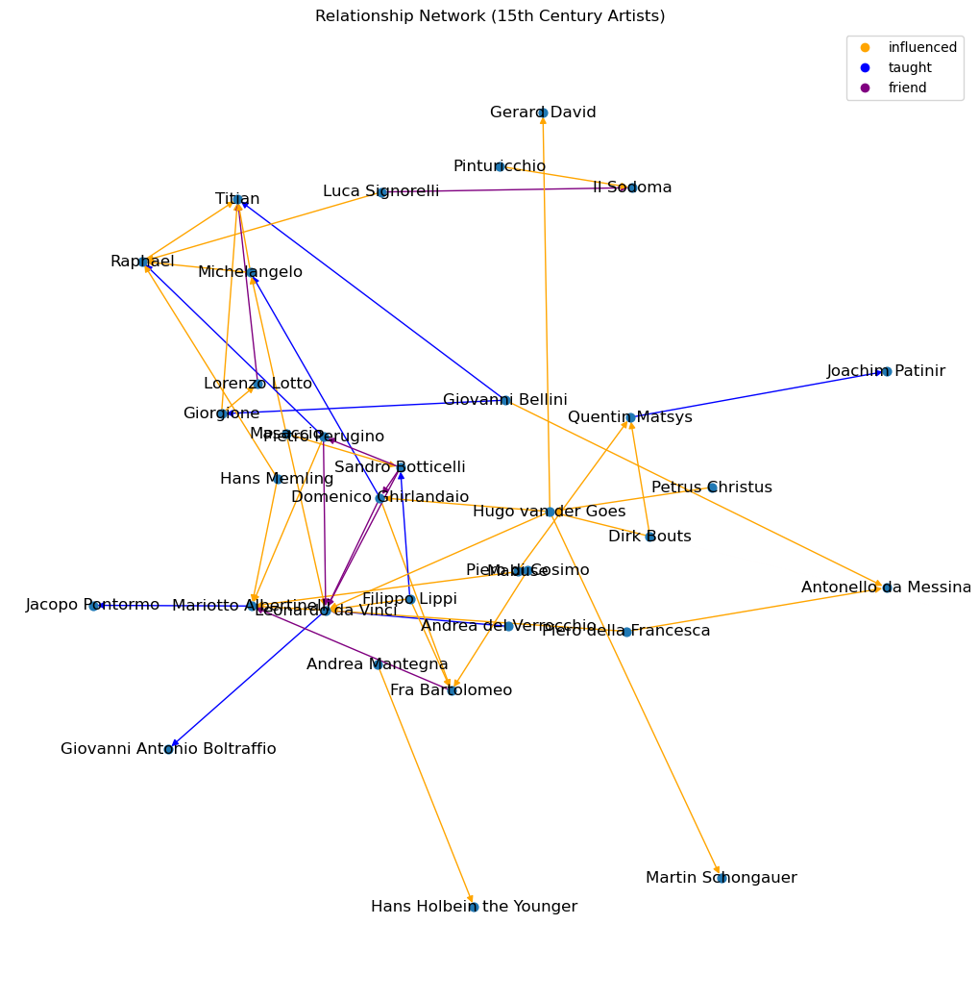

In [263]:
artist_relationships_15c = artist_relationships(artists_15c)
visualize_artist_relationships(artist_relationships_15c, "15th Century")

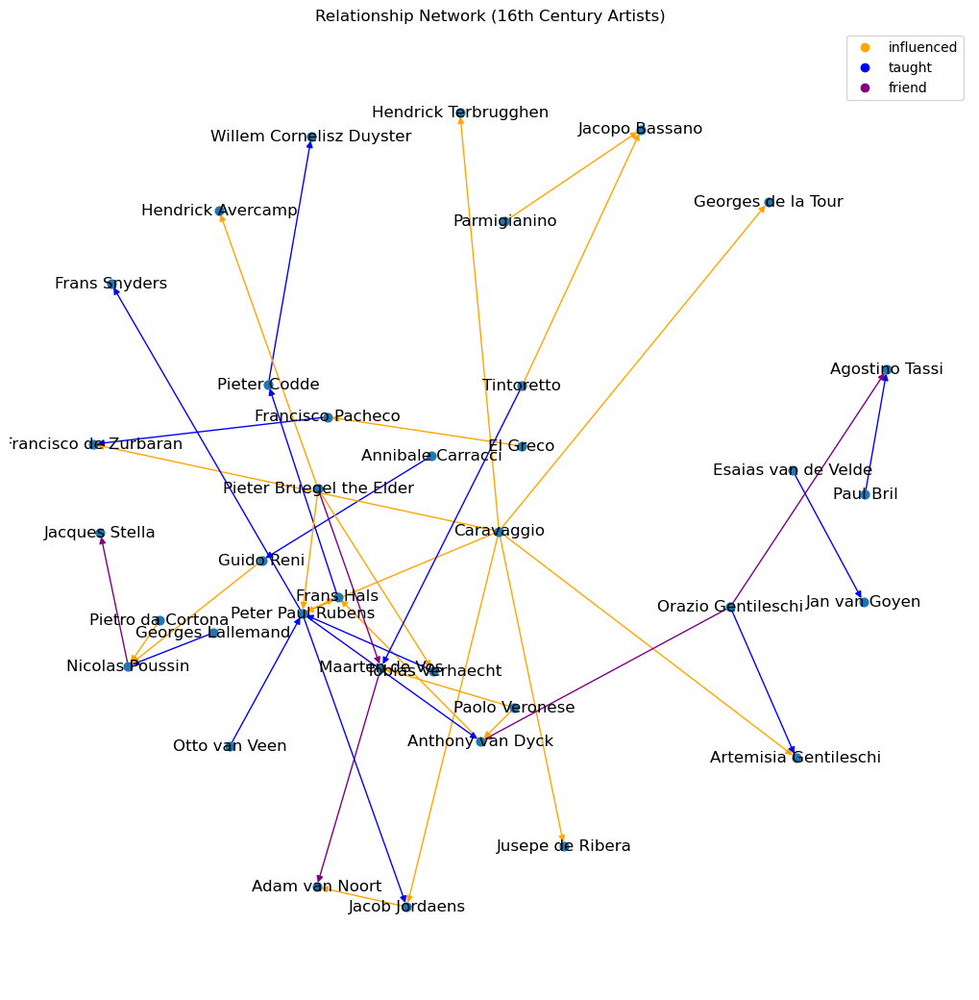

In [264]:
artist_relationships_16c = artist_relationships(artists_16c)
visualize_artist_relationships(artist_relationships_16c, "16th Century")

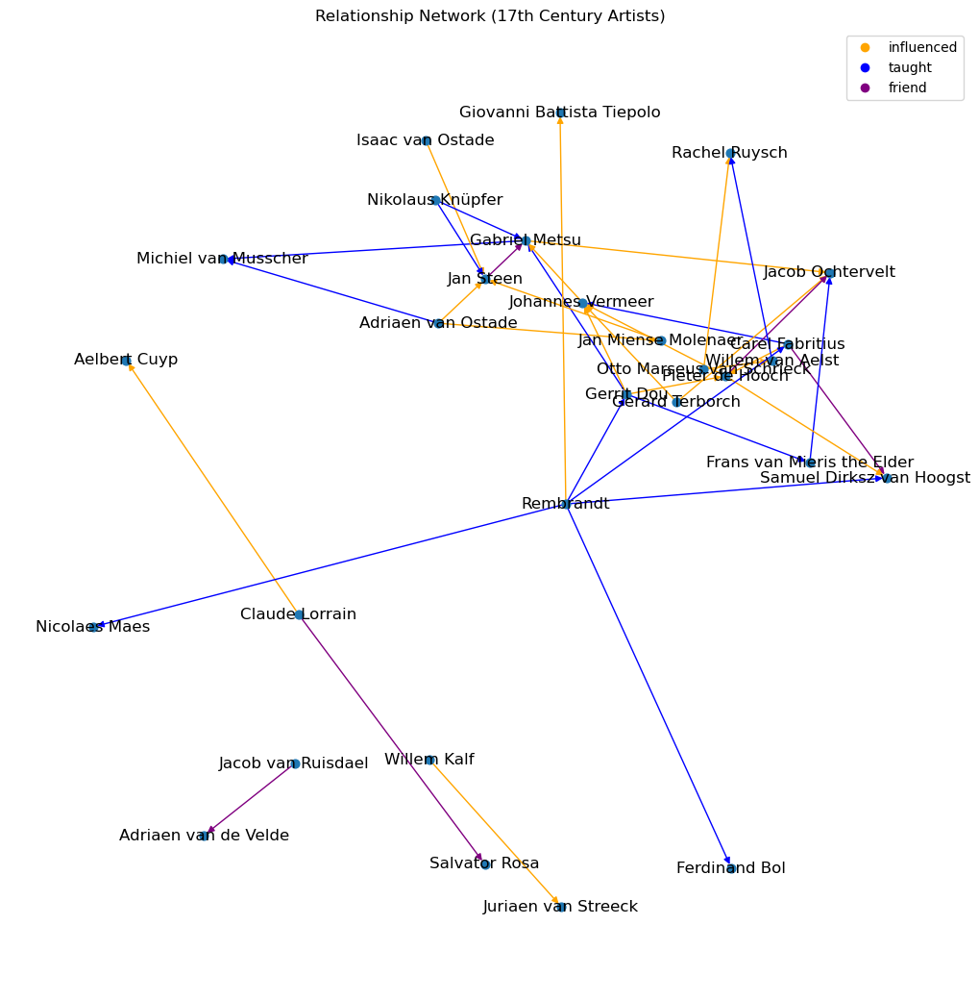

In [265]:
artist_relationships_17c = artist_relationships(artists_17c)
visualize_artist_relationships(artist_relationships_17c, "17th Century")

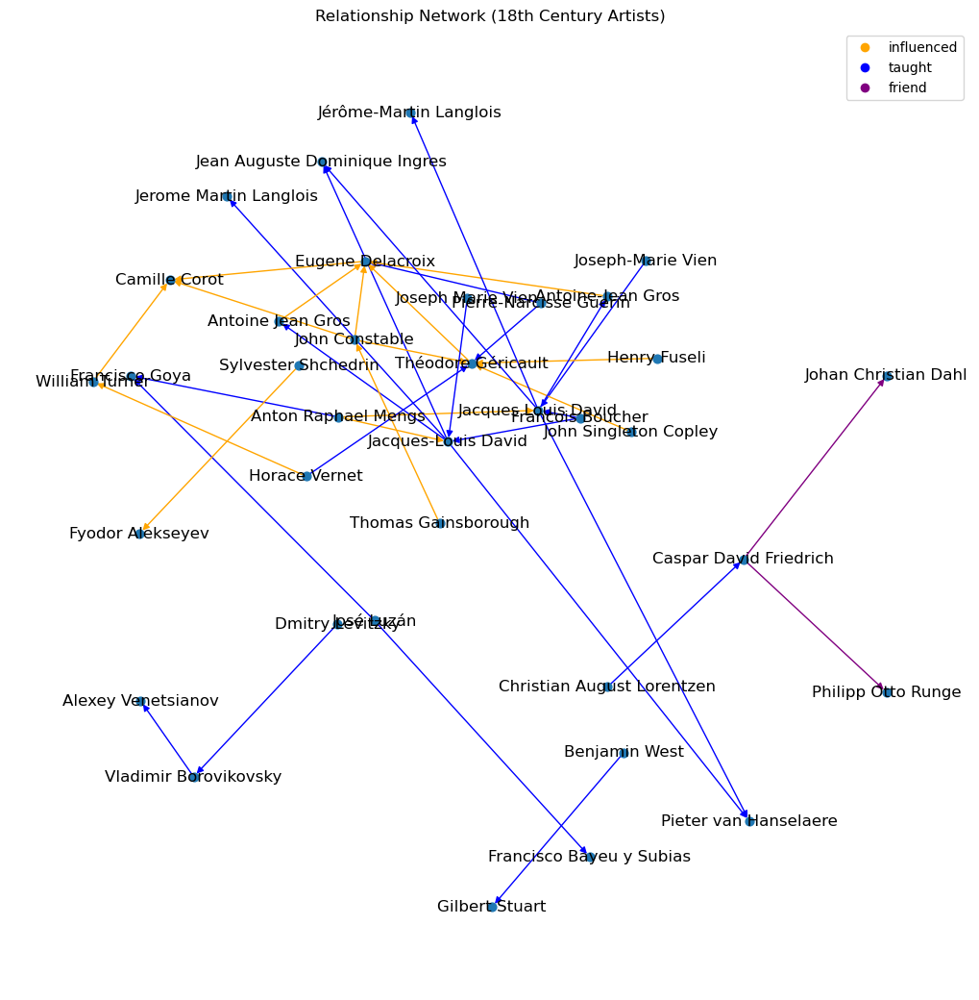

In [266]:
artist_relationships_18c = artist_relationships(artists_18c)
visualize_artist_relationships(artist_relationships_18c, "18th Century")

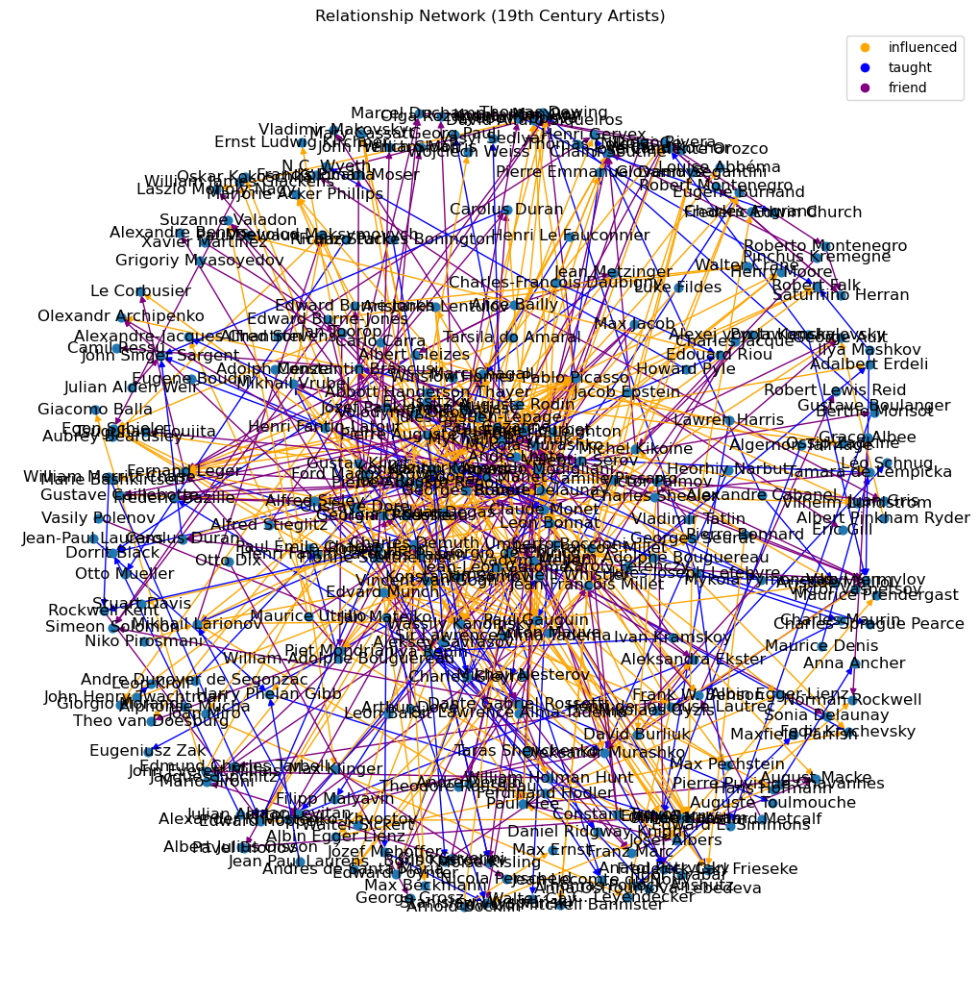

In [267]:
artist_relationships_19c = artist_relationships(artists_19c)
visualize_artist_relationships(artist_relationships_19c, "19th Century")

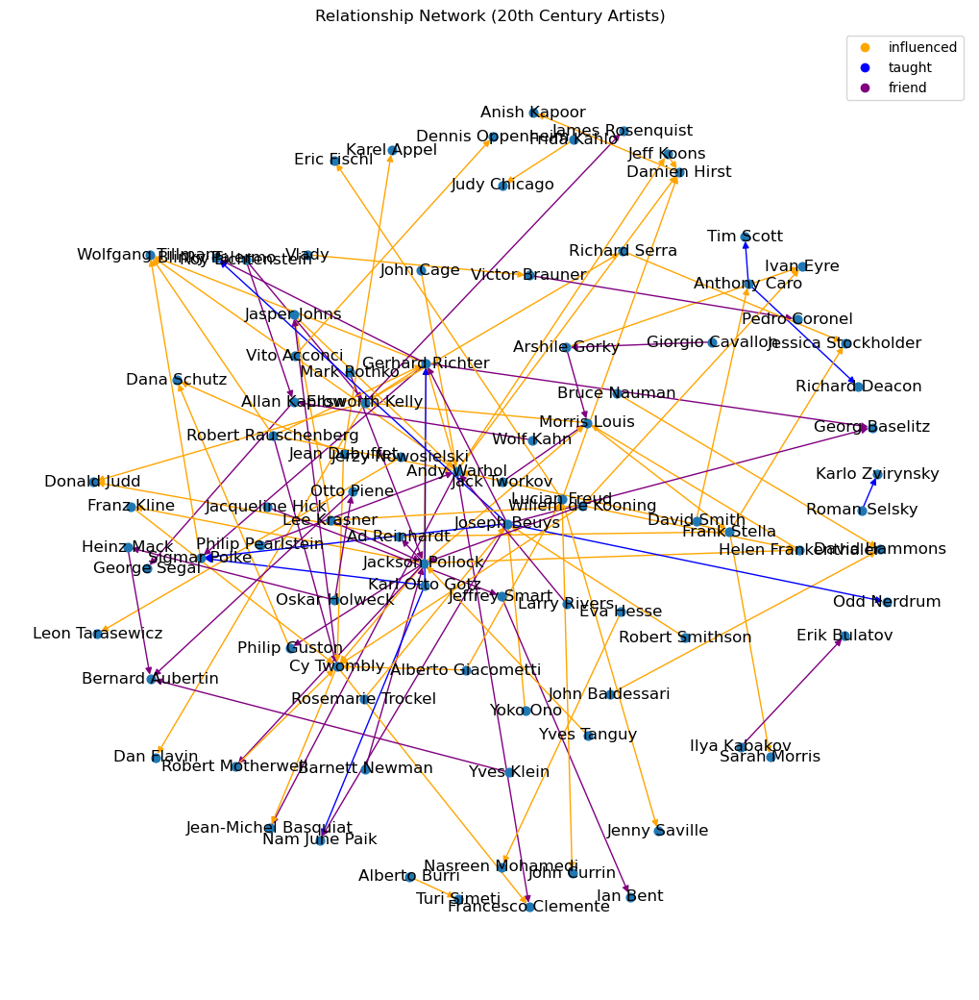

In [268]:
artist_relationships_20c = artist_relationships(artists_20c)
visualize_artist_relationships(artist_relationships_20c, "20th Century")

In [300]:
print("14th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_14c))

14th century relationship graph is DAG: True


In [301]:
print("15th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_15c))

15th century relationship graph is DAG: True


In [302]:
print("16th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_16c))

16th century relationship graph is DAG: True


In [303]:
print("17th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_17c))

17th century relationship graph is DAG: True


In [304]:
print("18th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_18c))

18th century relationship graph is DAG: True


In [305]:
print("19th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_19c))

19th century relationship graph is DAG: True


In [306]:
print("20th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_20c))

20th century relationship graph is DAG: True


In [277]:
# skeletonize relationship network by removing redundant edges for each type of relationship
def skeletonize_relationship_network(G):
    influenced_edges = [(u, v) for u, v, data in G.edges(data=True) if data['edge_type'] == 'influenced']
    taught_edges = [(u, v) for u, v, data in G.edges(data=True) if data['edge_type'] == 'taught']
    friend_edges = [(u, v) for u, v, data in G.edges(data=True) if data['edge_type'] == 'friend']
    edges_to_add_back = set()
    # keep longest directed paths possible for each type of edge
    # for influenced edges, if there is more than one path from u to v, remove the direct edge
    for u, v in influenced_edges:
        G.remove_edge(u, v)
        if not nx.has_path(G, u, v):
            edges_to_add_back.add((u, v, "influenced"))
    for u, v in taught_edges:
        G.remove_edge(u, v)
        if not nx.has_path(G, u, v):
            edges_to_add_back.add((u, v, "taught"))
    for u, v in friend_edges: 
        G.remove_edge(u, v)       
        if not nx.has_path(G, u, v):
            edges_to_add_back.add((u, v, "friend"))
    for u, v, edge_type in edges_to_add_back:
        G.add_edge(u, v, edge_type=edge_type)
    return G

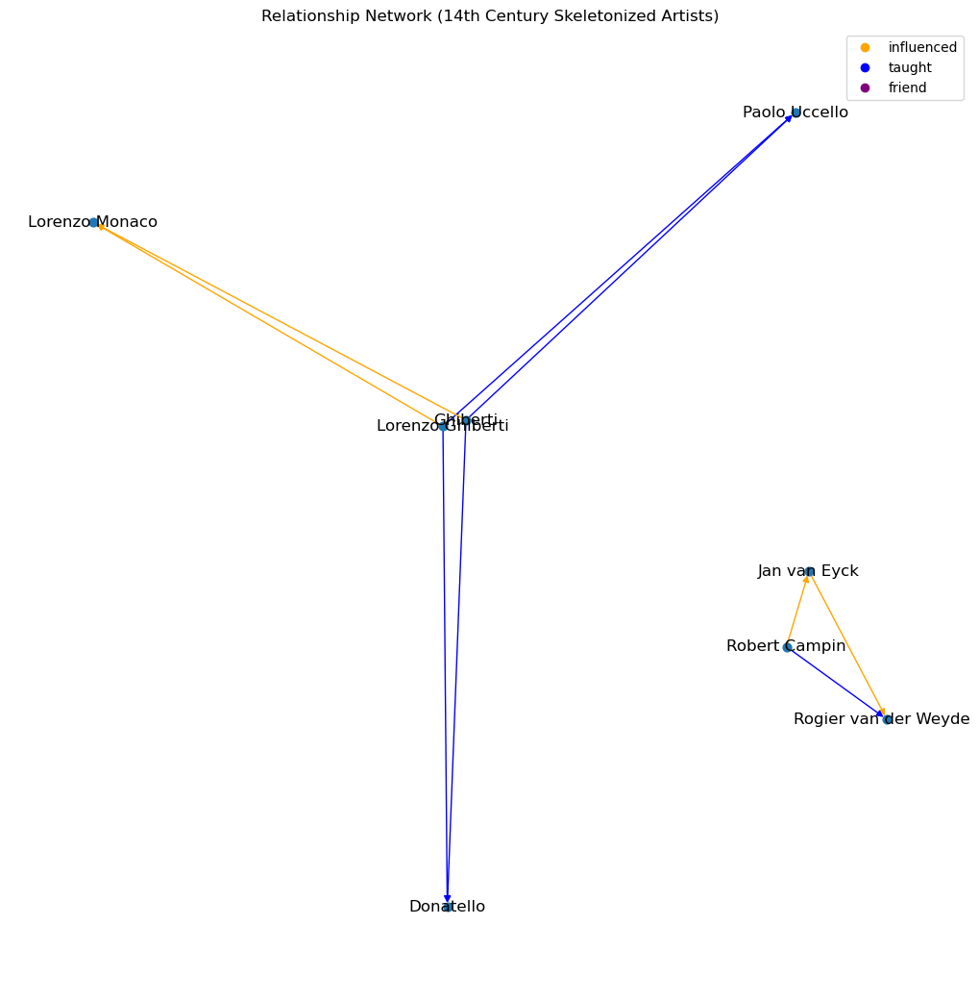

In [278]:
skeletonized_artist_relationships_14c = skeletonize_relationship_network(artist_relationships_14c)
visualize_artist_relationships(skeletonized_artist_relationships_14c, "14th Century Skeletonized")

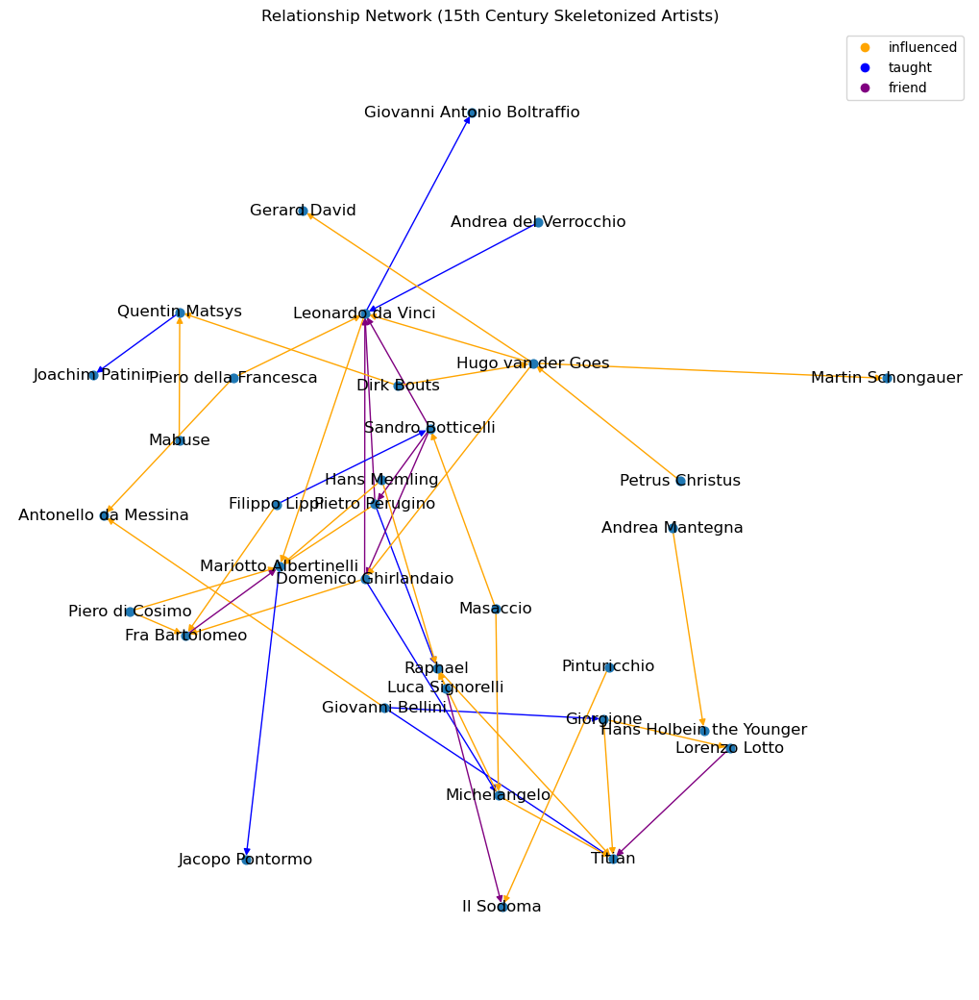

In [279]:
skeletonized_artist_relationships_15c = skeletonize_relationship_network(artist_relationships_15c)
visualize_artist_relationships(skeletonized_artist_relationships_15c, "15th Century Skeletonized")

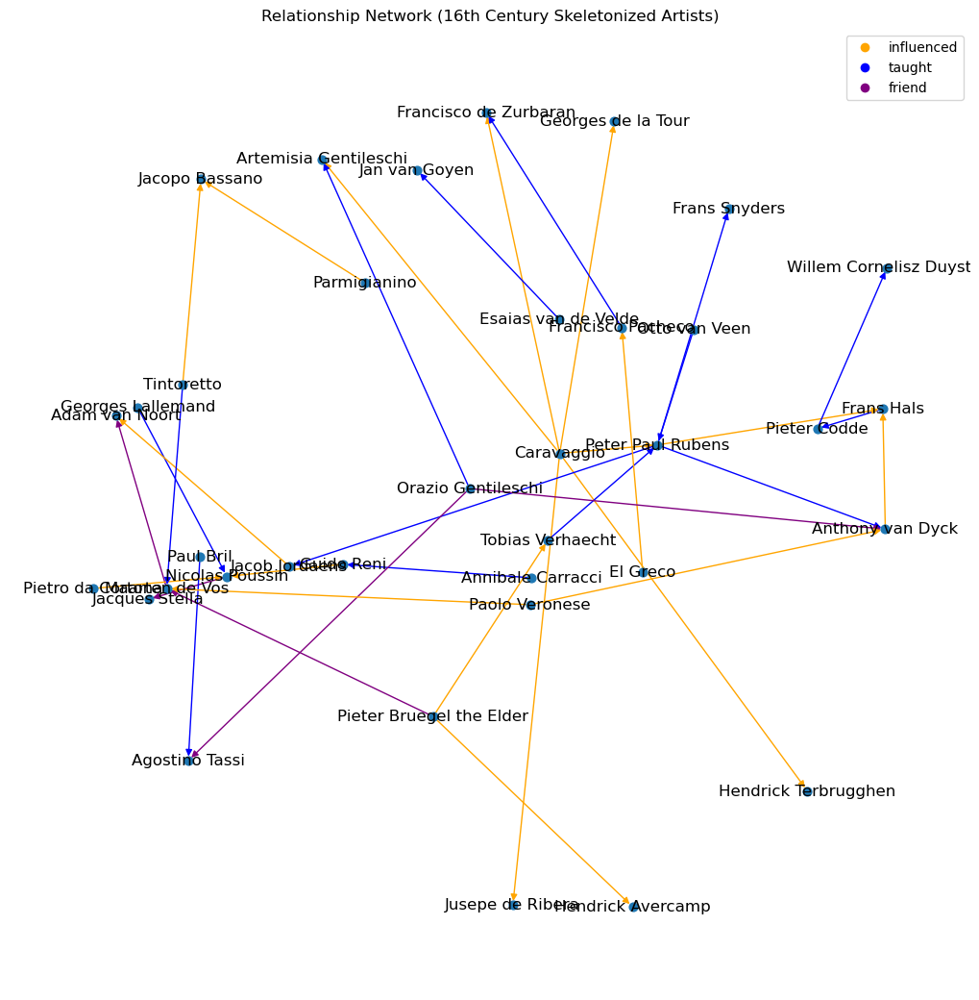

In [280]:
skeletonized_artist_relationships_16c = skeletonize_relationship_network(artist_relationships_16c)
visualize_artist_relationships(skeletonized_artist_relationships_16c, "16th Century Skeletonized")

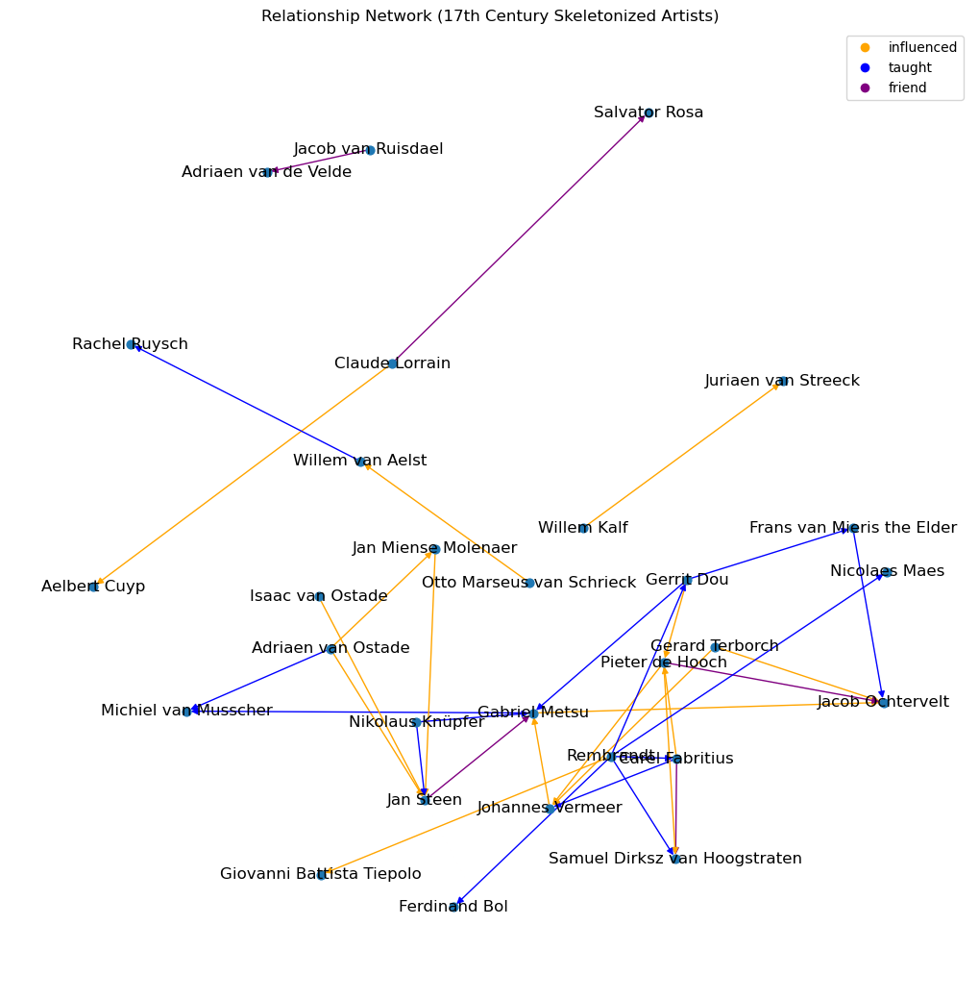

In [281]:
skeletonized_artist_relationships_17c = skeletonize_relationship_network(artist_relationships_17c)
visualize_artist_relationships(skeletonized_artist_relationships_17c, "17th Century Skeletonized")

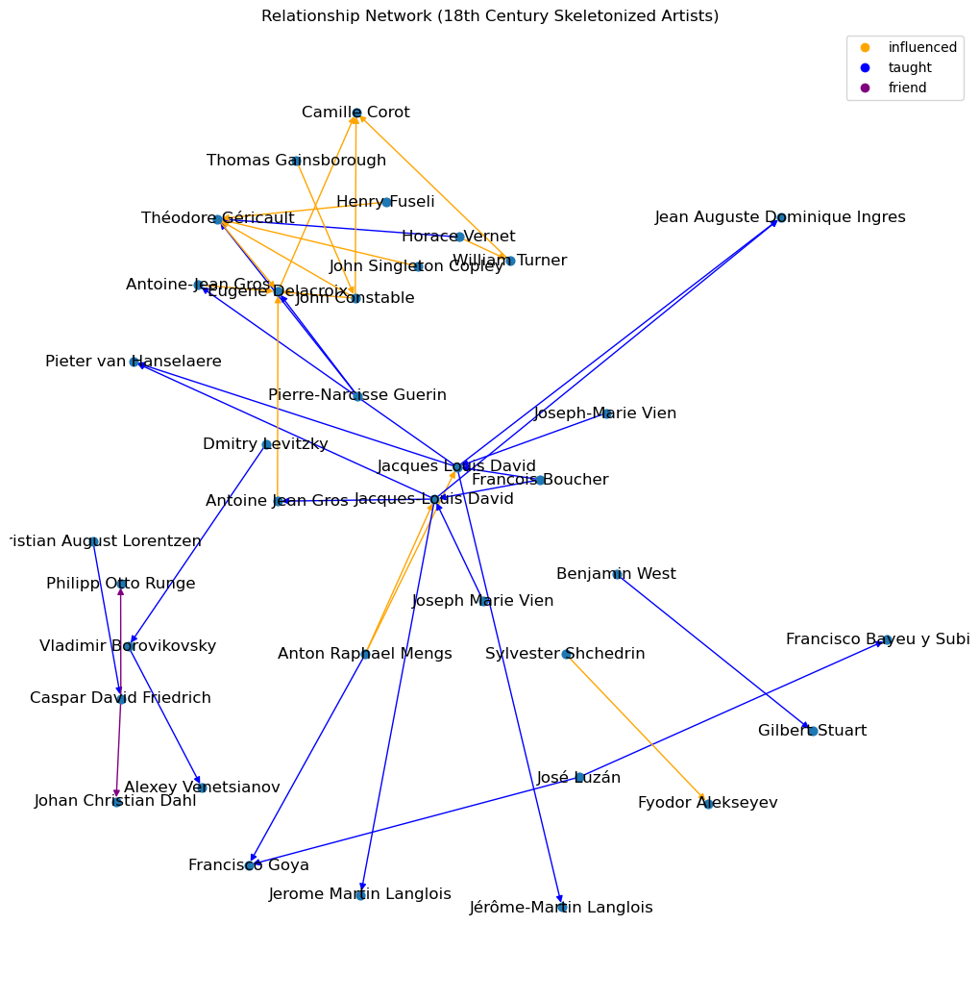

In [282]:
skeletonized_artist_relationships_18c = skeletonize_relationship_network(artist_relationships_18c)
visualize_artist_relationships(skeletonized_artist_relationships_18c, "18th Century Skeletonized")

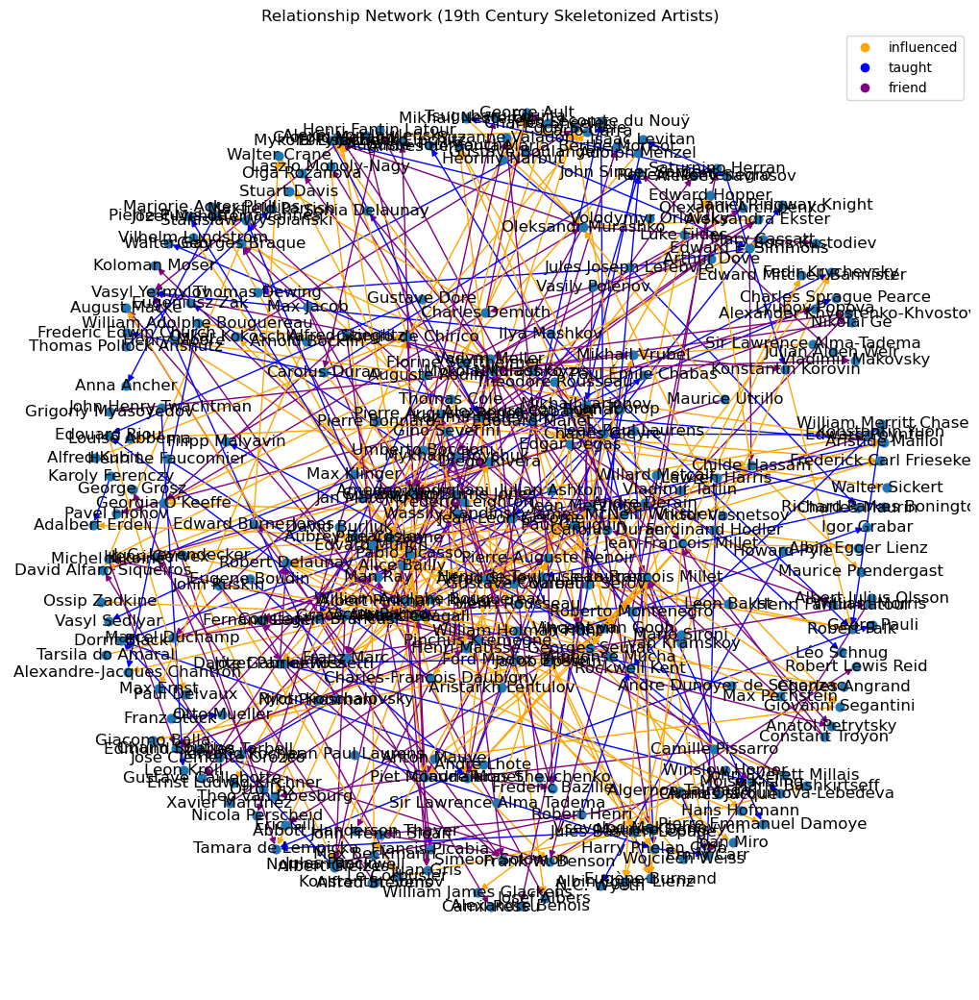

In [283]:
skeletonized_artist_relationships_19c = skeletonize_relationship_network(artist_relationships_19c)
visualize_artist_relationships(skeletonized_artist_relationships_19c, "19th Century Skeletonized")

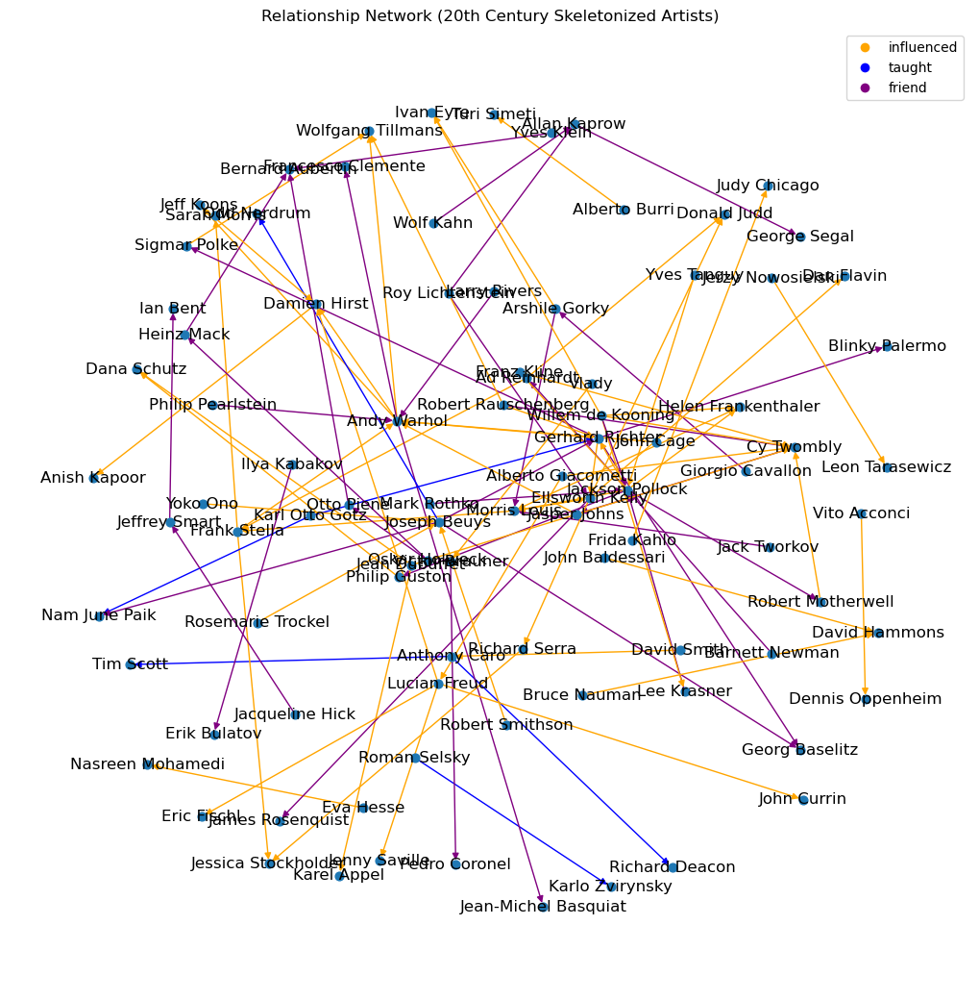

In [284]:
skeletonized_artist_relationships_20c = skeletonize_relationship_network(artist_relationships_20c)
visualize_artist_relationships(skeletonized_artist_relationships_20c, "20th Century Skeletonized")

In [285]:
# calculate intersection over union measure for all pairs of networks (4 x 4 matrix for each century)
def intersection_over_union(G1, G2):
    edges_G1 = set(G1.edges())
    edges_G2 = set(G2.edges())
    intersection = edges_G1.intersection(edges_G2)
    union = edges_G1.union(edges_G2)
    if len(union) == 0:
        return 0
    return len(intersection) / len(union)

In [286]:
# for each century, calculate intersection over union for each pair of networks (geo proximity, style sharing, exhibition sharing, relationships)
# note: will use NON-skeletonized relationship network
def calculate_iou_matrix(geo_G, style_G, exhibition_G, relationship_G):
    # duplicate all edges in relationship_G to make it undirected for better comparison with other networks
    relationship_G_undirected = nx.Graph()
    relationship_G_undirected.add_nodes_from(relationship_G.nodes())
    for u, v, data in relationship_G.edges(data=True):
        relationship_G_undirected.add_edge(u, v)
    networks = [geo_G, style_G, exhibition_G, relationship_G_undirected]
    iou_matrix = [[0 for _ in range(len(networks))] for _ in range(len(networks))]
    for i in range(len(networks)):
        for j in range(len(networks)):
            iou_matrix[i][j] = intersection_over_union(networks[i], networks[j])
    return iou_matrix

In [287]:
def visualize_iou_matrix(iou_matrix, tag):
    data = np.array(iou_matrix, dtype=float)

    fig, ax = plt.subplots(figsize=(8, 6))
    im = ax.imshow(data, cmap='Blues')

    labels = ['Geo Proximity', 'Style Sharing', 'Exhibition Sharing', 'Relationships']
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels)
    ax.set_yticklabels(labels)

    # rotate x labels
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    # annotate each cell
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            ax.text(j, i, f"{data[i, j]:.2f}",
                    ha="center", va="center", color="black")

    ax.set_title(f'Intersection Over Union Matrix ({tag} Artists)')
    fig.colorbar(im)

    plt.tight_layout()
    plt.savefig('iou_heatmap.png', bbox_inches='tight')
    plt.show()

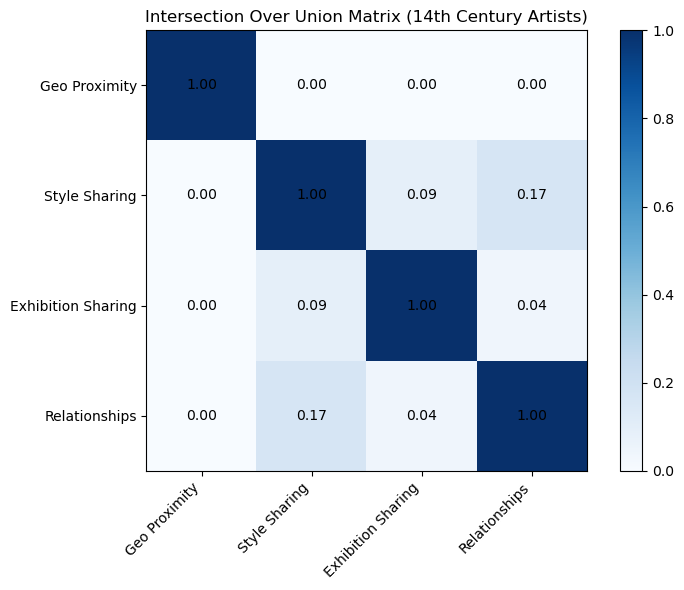

In [288]:
iou_matrix_14c = calculate_iou_matrix(geo_proximity(artists_14c), style_share(artists_14c), shared_exhibitions(artists_14c), artist_relationships(artists_14c))
# print("IOU Matrix for 14th Century Artists:")
# print(iou_matrix_14c)
visualize_iou_matrix(iou_matrix_14c, "14th Century")

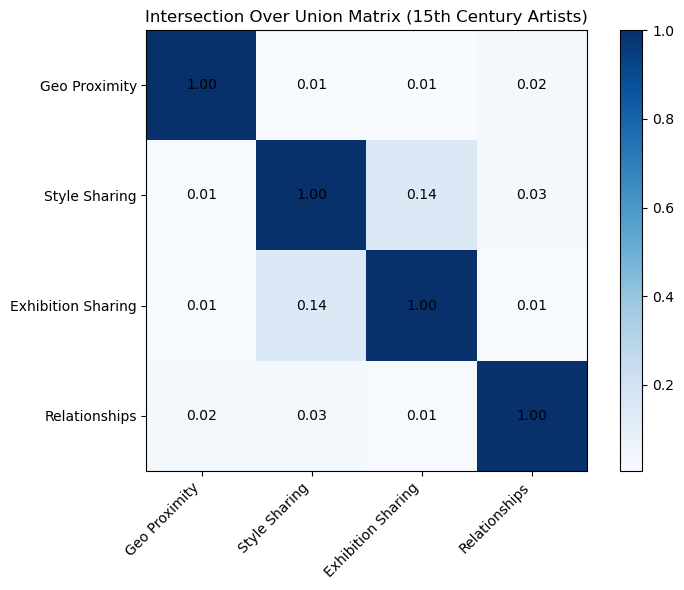

In [289]:
iou_matrix_15c = calculate_iou_matrix(geo_proximity(artists_15c), style_share(artists_15c), shared_exhibitions(artists_15c), artist_relationships(artists_15c))
visualize_iou_matrix(iou_matrix_15c, "15th Century")

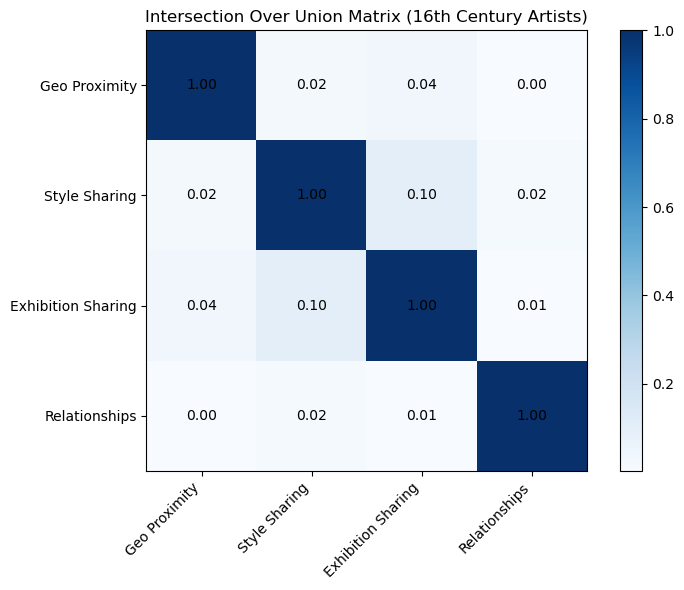

In [290]:
iou_matrix_16c = calculate_iou_matrix(geo_proximity(artists_16c), style_share(artists_16c), shared_exhibitions(artists_16c), artist_relationships(artists_16c))
visualize_iou_matrix(iou_matrix_16c, "16th Century")

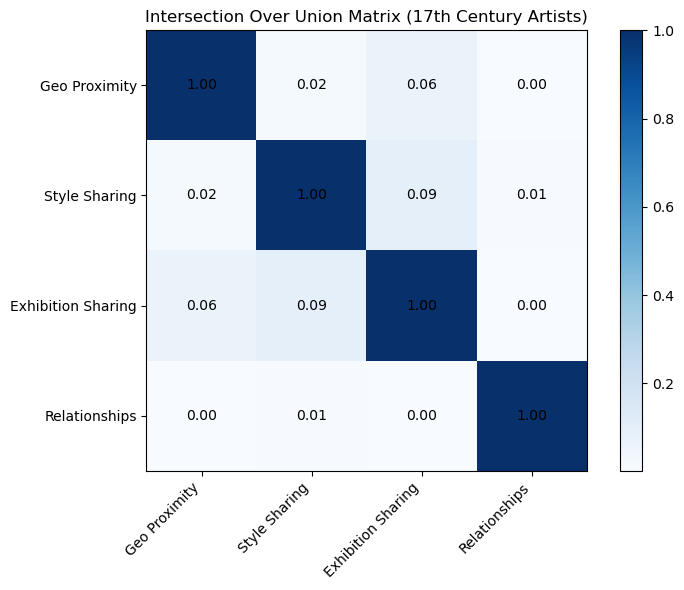

In [291]:
iou_matrix_17c = calculate_iou_matrix(geo_proximity(artists_17c), style_share(artists_17c), shared_exhibitions(artists_17c), artist_relationships(artists_17c))
visualize_iou_matrix(iou_matrix_17c, "17th Century")

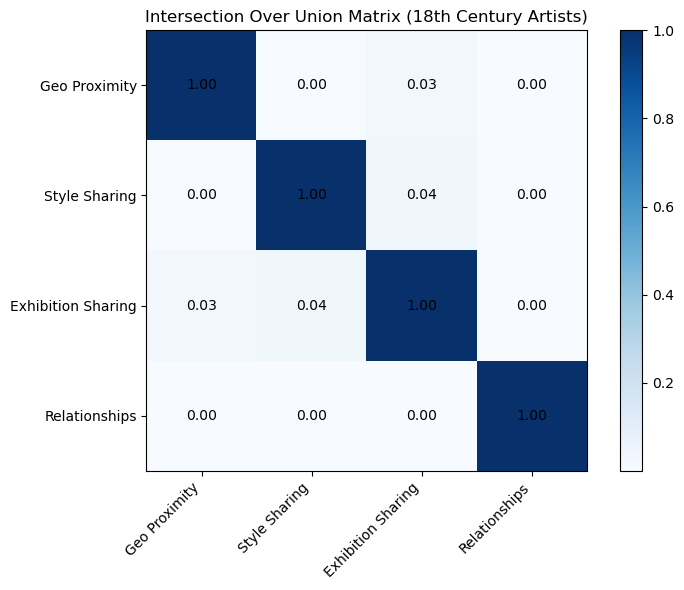

In [292]:
iou_matrix_18c = calculate_iou_matrix(geo_proximity(artists_18c), style_share(artists_18c), shared_exhibitions(artists_18c), artist_relationships(artists_18c))
visualize_iou_matrix(iou_matrix_18c, "18th Century")

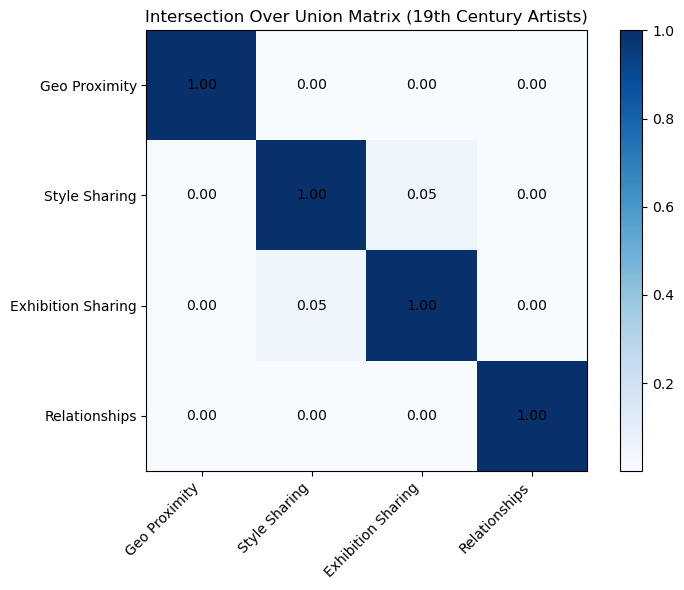

In [293]:
iou_matrix_19c = calculate_iou_matrix(geo_proximity(artists_19c), style_share(artists_19c), shared_exhibitions(artists_19c), artist_relationships(artists_19c))
visualize_iou_matrix(iou_matrix_19c, "19th Century")

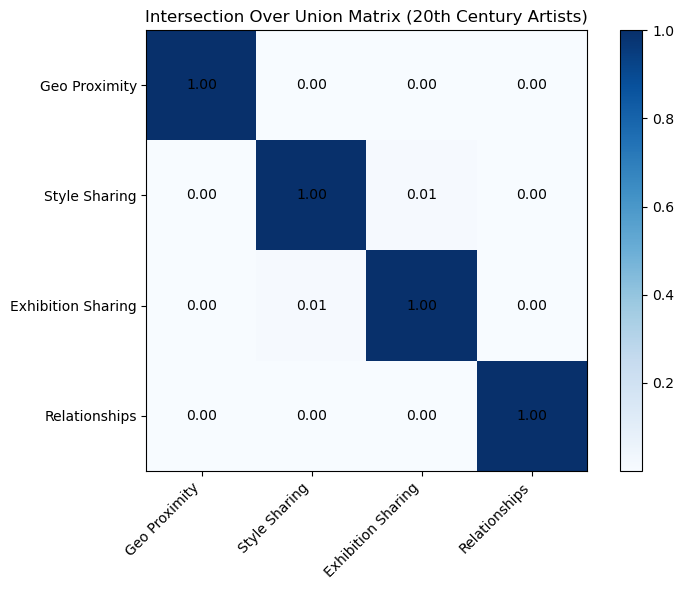

In [294]:
iou_matrix_20c = calculate_iou_matrix(geo_proximity(artists_20c), style_share(artists_20c), shared_exhibitions(artists_20c), artist_relationships(artists_20c))
visualize_iou_matrix(iou_matrix_20c, "20th Century")

In [295]:
# complementary graphs (nodes = location/style/exhibition, edges = artists)

In [ ]:
# presentation (recommended 5 slides, 4 visuals, pick earlier and later centuries to show, and list potential questions)

# potential questions:
# which artist was central / quite influential?
# can we construct directed links between the categories derived from the directed artist influence graph and the complementary graphs?
# analyze gender


# m: complementary graphs
# r: 
# t: look into Barabasi art network project, help m with pushing to github